# Project N° 2: Open Food facts

## Introduction: 
The Open Food Facts project is a collaborative, free and open food database gathering information and data on food products from around the world. While the project originated in France in 2012, it has since been extended worldwide. Contributions to the database can be entered by anyone, based on information explicitely shown on food packages. 
These info include: 
* generic name, 
* quantity, 
* type of packaging, 
* brand, 
* category, 
* manufacturing or processing locations, 
* countries and stores where the product is sold, 
* list of ingredients, 
* any traces (for allergies, dietary laws or any specific diet), 
* food additives 
* nutritional information. 

In addition to fields completed by users, the data also contains: 
* machine computed fields such as the name of the contributor or the date of the contribution
* composite fields based on the other data fields, such as the nutrition score for example. 

As of today, the database contains entries for more than 1,000,000 food products, from more than 150 countries. 

**The goal for this project is to explore the dataset and analyze the relationships between the different variables and discover underlying connections.**

## Project outline
For this project, we will follow the general outline defined in the cours project rules: 
* A. Data import and high level exploration: The goal is to clean and preprocess the data, as well as explore the dataset in order to uncover interesting points to investigate.
* B. In-depth analysis: The goal is to formulate 3 questions about the dataset, based on the previous exploration and to perform the necessary steps to answer those questions. 
* C. Text data: The goal is to demonstrate the comprehension of text data analysis techniques showed in the course by finding the five most common ingredients.
* D. Time series analysis: The goal is to demonstrate the comprehension of time series analysis techniques showed in the course.
* E. Build a database: The goal is to desmontrate the comprehension on databases in python as shown in the course. 
* F. Finding correlations: The goal is to study relationships between the variables and provide some insight into which factors cause both a low or a high nutritional score. 




In [1]:
#load libraries

import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import random
%matplotlib inline
import seaborn as sns
import re
import string
import collections
from textwrap import wrap
import datetime
import sqlite3

import csv
pd.set_option('display.max_colwidth', -1)

## A. Data import and high level exploration:
### A.a. Data import
This section will describe the process that was followed to import the data in a satisfying way.

A first attempt at loading the dataset with:
```
food = pd.read_csv("./data/en.openfoodfacts.org.products.tsv", 
                   sep = "\t"
                  )
```
yielded the following warning: 
```
DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
```

This warning causes the corresponding columns to be dropped upon import. In order to investigate this specific issue, it was decided to first import only these problematic columns to determine if this is an expected behaviour (datafield that could legitimately contain text and numeric data as valid data but should be treated as text data anyway) or not. 


In [2]:
# load data
warning_food = pd.read_csv("./data/en.openfoodfacts.org.products.tsv", 
                   sep = "\t", 
                   dtype = 'object', 
                   usecols = [0,3,5,19,20,24,25,26,27,28,36,37,38,39,48]
                  )

In [3]:
# check the dimension of the dataset
warning_food.shape

(356027, 15)

The resulting dataset contains 356027 observations and the 15 selected columns. 

The problematic columns are: 
    

In [4]:
print(warning_food.columns)

Index(['code', 'created_t', 'last_modified_t', 'manufacturing_places',
       'manufacturing_places_tags', 'emb_codes', 'emb_codes_tags',
       'first_packaging_code_geo', 'cities', 'cities_tags', 'allergens_en',
       'traces', 'traces_tags', 'traces_en', 'ingredients_from_palm_oil_tags'],
      dtype='object')


In [5]:
warning_food.head()

,code,created_t,last_modified_t,manufacturing_places,manufacturing_places_tags,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,allergens_en,traces,traces_tags,traces_en,ingredients_from_palm_oil_tags
0,0000000003087,1474103866,1474103893,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,1489069957,1489069957,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0000000004559,1489069957,1489069957,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0000000016087,1489055731,1489055731,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0000000016094,1489055653,1489055653,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



The 3 first problematic columns are `code`, `created_t` and `last_created_t`, which I would expect python to try to import as integers, without instructions.

All the other columns however are fields where text would be expected. 

First, we investigate the `code`variable by displaying rows where `code` is unable to be converted from object to int: 

In [6]:
code_issue = warning_food[pd.to_numeric(warning_food.code, errors = "coerce").isna()]
code_issue.shape

(27, 15)

This yielded 27 rows where code could not be converted from string to integer: 

In [7]:
code_issue.head()

,code,created_t,last_modified_t,manufacturing_places,manufacturing_places_tags,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,allergens_en,traces,traces_tags,traces_en,ingredients_from_palm_oil_tags
112010,010503886234612215160606,1463907769,1463907769,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
193908,NaN,France,"Belgique,France","E101 - Riboflavin,E120 - Cochineal,E1422 - Acetylated distarch adipate,E160c - Paprika extract,E412 - Guar gum,E440 - Pectins",0,NaN,NaN,NaN,b,Milk and dairy products,http://en.openfoodfacts.org/images/products/303/349/043/3864/front.3.200.jpg,95.2,NaN,3.2,NaN
193944,NaN,"Villecresnes,Villeurbanne,France",France,"E120 - Cochineal,E163 - Anthocyanins,E333 - Calcium citrates,E410 - Locust bean gum,E412 - Guar gum,E440 - Pectins,E440i - Pectin",0,NaN,NaN,NaN,b,Milk and dairy products,http://en.openfoodfacts.org/images/products/303/349/059/4510/front.20.200.jpg,393,NaN,2.9,NaN
193950,NaN,France,"Belgique,France, en:switzerland","E141 - Copper complexes of chlorophylls and chlorophyllins,E1422 - Acetylated distarch adipate,E412 - Guar gum,E440 - Pectins",0,NaN,NaN,NaN,c,Milk and dairy products,http://en.openfoodfacts.org/images/products/303/349/059/5517/front.4.200.jpg,397,NaN,3.2,NaN
193960,NaN,"Veynes,France",France,"E120 - Cochineal,E1422 - Acetylated distarch adipate,E160c - Paprika extract,E163 - Anthocyanins,E330 - Citric acid,E331 - Sodium citrates,E410 - Locust bean gum,E412 - Guar gum,E440 - Pectins",0,NaN,NaN,NaN,c,Milk and dairy products,http://en.openfoodfacts.org/images/products/303/349/061/8889/front.12.200.jpg,408,NaN,3.5,NaN


While the first row is most likely because the resulting integer would be outside of int64 space and should therefore be as expected, the 26 other rows are actual missing values in code and are also associated with unexpected values in the other fields (eg: towns/places in created_t and last_modified_t, urls in allergens_en, etc.). 

As the pattern of unexpected values is the same for all 26 rows with missing codes, and given that code is probably an automatic field not subjected to user error, it was suspected that this was the result of a parsing error while importing the dataset in python. 

The original .tsv file was investigated in bash to identify unusual characters causing an unexpected breakline. the following : '^M' was identified 26 times. This character can appear when a file created in a Windows environment is opened in a Unix based environment and is interpreted as a break line. 

This character was removed in bash with the following command: 

```
cat en.openfoodfacts.org.products.tsv | tr -d '\r' > food_data.tsv
```

As the datafile is large, we cannot add it to the git repository, but by executing the above command in a terminal in the directory where your data is stored, you will get the resulting dataset that is used as the initial loaded dataset. 
After this, there are no more issues with `created_t`and `last_modified_t` and no missing values for `code`. 

Regarding the 12 other columns, these are text variables. However, as the first row contains `NaN` values, pd.read_csv infers that their dtype should be floats (`NaN` is considered a float) and therefore, when an actual string is encountered, the warning is sent. 

In order to be able to load these data, we will use the dtype option of `pd.read_csv()`to specify the dtype of these variables. 

In addition, we also use the `parse_dates`option to give the correct dtype to the 2 datetime variables: `created_datetime`and `last_modified_datetime`. 

In [8]:
# loading dataset without unexpected breakline and specifying the dtype
food_clean = pd.read_csv("./data/food_data.tsv",
                         sep = "\t",
                         dtype = {'code': 'str',
                                  'manufacturing_places': 'str',
                                  'manufacturing_places_tags': 'str',
                                  'emb_codes': 'str',
                                  'emb_codes_tags': 'str',
                                  'first_packaging_code_geo': 'str',
                                  'cities_tags': 'str',
                                  'allergens_en': 'str',
                                  'traces': 'str',
                                  'traces_tags': 'str',
                                  'traces_en': 'str',
                                  'ingredients_from_palm_oil_tags': 'str'}, 
                         parse_dates = ["created_datetime", "last_modified_datetime"]
                        )

food_clean.shape

(356001, 163)

As expected, we have now 356001 rows and 163 columns. 
The dataset is correctly imported and ready for cleaning. 

### A.b Data cleaning

As a first step, we investigate missing values in the dataset. 

In [9]:
print("{}% of the values are missing in the whole dataset".format(round(food_clean.isna().sum().sum()*100/(food_clean.shape[0]*food_clean.shape[1])), 2))

76.0% of the values are missing in the whole dataset


We can see that the dataset contains a lot of missing values. The following figure displays the proportion of NaNs per column, colored by their dtype: 

In [10]:
### Compute and sort proportion of NAs per column

prop_NA_col = food_clean.isna().sum()*100 / food_clean.shape[0]
prop_NA_col.sort_values(ascending = True, inplace = True)

In [11]:
prop_NA_col_df = pd.DataFrame(prop_NA_col, columns = ["Proportion of NAs"])

In [12]:
dtypes_df = pd.DataFrame(food_clean.dtypes, columns = ["dtypes"]).reindex(prop_NA_col_df.index)

In [13]:
dtypes_df["dtypes"] = dtypes_df["dtypes"].apply(lambda x: str(x))

In [14]:
# Unique category labels: 'D', 'F', 'G', ...
color_labels = dtypes_df['dtypes'].unique()

# List of RGB triplets
rgb_values = sns.color_palette("Set2", 8)

# Map label to RGB
color_map = dict(zip(color_labels, rgb_values))



In [15]:
        
# Unique category labels: 'D', 'F', 'G', ...
color_labels = dtypes_df['dtypes'].unique()

# List of RGB triplets
rgb_values = sns.color_palette("Set2", 8)

# Map label to RGB
color_map = dict(zip(color_labels, rgb_values))



In [16]:
dtypes_df["color"] = dtypes_df["dtypes"].map(color_map)
dtypes_df.head()

,dtypes,color
code,object,"(0.4, 0.7607843137254902, 0.6470588235294118)"
states,object,"(0.4, 0.7607843137254902, 0.6470588235294118)"
states_tags,object,"(0.4, 0.7607843137254902, 0.6470588235294118)"
last_modified_datetime,"datetime64[ns, UTC]","(0.9882352941176471, 0.5529411764705883, 0.3843137254901961)"
last_modified_t,int64,"(0.5529411764705883, 0.6274509803921569, 0.796078431372549)"


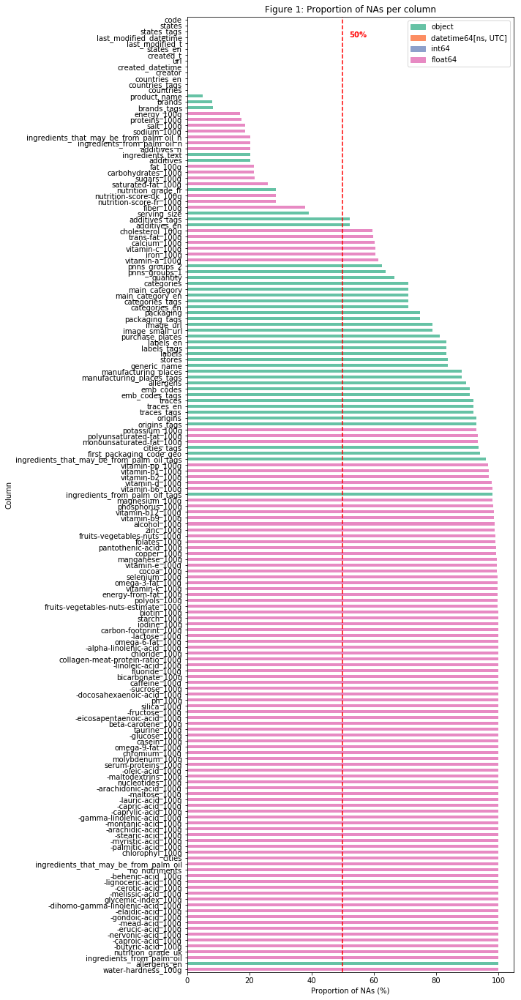

In [17]:
plt.figure(figsize=(8,24))
#colormap = plt.cm.tab20(range(0, 10))
barplot = prop_NA_col_df["Proportion of NAs"].plot.barh(color = dtypes_df["color"])
barplot.set_title('Figure 1: Proportion of NAs per column')
barplot.set_xlabel('Proportion of NAs (%)')
barplot.set_ylabel('Column')
barplot.invert_yaxis()
barplot.axvline(x=50, linestyle = '--', color = 'red')
barplot.text(52, 3, '50%', color = 'red', fontweight = 'bold')
plt.legend(handles, labels)
plt.show()

We can see on figure 1 that a lot of variables have a very high proportion of missing values, going up to 100%. 


In [18]:
print("Only {} variables have less than 50% of missing values".format(len(prop_NA_col[prop_NA_col<50])))

Only 34 variables have less than 50% of missing values


Dropping variables with a very large number of missing values would be a good first filter, as a variable with few values would not be very informative. 

However, as different countries might have different food packaging/labelling policies for example, it might be interesting to investigate if this pattern of missing values is consistent accross countries. 

Below is displayed the top 5 countries with the most product entered in the database:


In [19]:
food_clean["countries_tags"].value_counts().head(5)

en:united-states    173159
en:france           123983
en:switzerland      14932 
en:germany          8470  
en:spain            5529  
Name: countries_tags, dtype: int64

We can see that most of the products were entered in the USA and in France and represents more than 83% of the products entered. This is within taking into considerations products with more than one country in `countries_tags`. 

To compare the patterns of missing values, we extract all products with France listed in `countries_tags` and all products with United States listed in `countries_tags`, compute the proportion of missing values and plot them together on a grouped barplot. 

In [20]:
food_clean_france = food_clean.loc[food_clean.countries_tags.str.contains(r"france", na = False)]
food_clean_france.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,fruits-vegetables-nuts_100g,fruits-vegetables-nuts-estimate_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-en.openfoodfacts.org/product/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17 09:17:46+00:00,1474103893,2016-09-17 09:18:13+00:00,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,0000000020114,http://world-en.openfoodfacts.org/product/0000000020114/naturablue-original-natura4ever,chris13,1502444009,2017-08-11 09:33:29+00:00,1502444210,2017-08-11 09:36:50+00:00,Naturablue original,NaN,250ml,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47,0000000024600,http://world-en.openfoodfacts.org/product/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17 08:45:04+00:00,1434535914,2015-06-17 10:11:54+00:00,Filet de bœuf,NaN,2.46 kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49,0000000027205,http://world-en.openfoodfacts.org/product/0000000027205,tacinte,1458238630,2016-03-17 18:17:10+00:00,1458238638,2016-03-17 18:17:18+00:00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51,0000000030113,http://world-en.openfoodfacts.org/product/0000000030113/naturakrill-original-natura4ever,chris13,1502444266,2017-08-11 09:37:46+00:00,1502444428,2017-08-11 09:40:28+00:00,Naturakrill original,NaN,60 capsules,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
food_clean_usa = food_clean.loc[food_clean.countries_tags.str.contains(r"united-states", na = False)]
food_clean_usa.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,fruits-vegetables-nuts_100g,fruits-vegetables-nuts-estimate_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
1,0000000004530,http://world-en.openfoodfacts.org/product/0000000004530/banana-chips-sweetened-whole,usda-ndb-import,1489069957,2017-03-09 14:32:37+00:00,1489069957,2017-03-09 14:32:37+00:00,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,0000000004559,http://world-en.openfoodfacts.org/product/0000000004559/peanuts-torn-glasser,usda-ndb-import,1489069957,2017-03-09 14:32:37+00:00,1489069957,2017-03-09 14:32:37+00:00,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,0000000016087,http://world-en.openfoodfacts.org/product/0000000016087/organic-salted-nut-mix-grizzlies,usda-ndb-import,1489055731,2017-03-09 10:35:31+00:00,1489055731,2017-03-09 10:35:31+00:00,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,0000000016094,http://world-en.openfoodfacts.org/product/0000000016094/organic-polenta-bob-s-red-mill,usda-ndb-import,1489055653,2017-03-09 10:34:13+00:00,1489055653,2017-03-09 10:34:13+00:00,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0000000016100,http://world-en.openfoodfacts.org/product/0000000016100/breadshop-honey-gone-nuts-granola-unfi,usda-ndb-import,1489055651,2017-03-09 10:34:11+00:00,1489055651,2017-03-09 10:34:11+00:00,Breadshop Honey Gone Nuts Granola,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
### Compute and sort numbers of NAs per column for France, USA and global

prop_NA_col_france = food_clean_france.isna().sum()*100 / food_clean_france.shape[0]
prop_NA_col_france.sort_values(ascending = True, inplace = True)
prop_NA_col_df_france = pd.DataFrame(prop_NA_col_france, columns = ["Proportion of NAs"]).reindex(prop_NA_col_df.index)


prop_NA_col_usa = food_clean_usa.isna().sum()*100 / food_clean_usa.shape[0]
prop_NA_col_usa.sort_values(ascending = True, inplace = True)
prop_NA_col_df_usa = pd.DataFrame(prop_NA_col_usa, columns = ["Proportion of NAs"]).reindex(prop_NA_col_df.index)

num_NA_col = food_clean.isna().sum()
num_NA_col.sort_values(ascending = True, inplace = True)
num_NA_col_df = pd.DataFrame(num_NA_col, columns = ["Number of NAs"]).reindex(prop_NA_col_df.index)

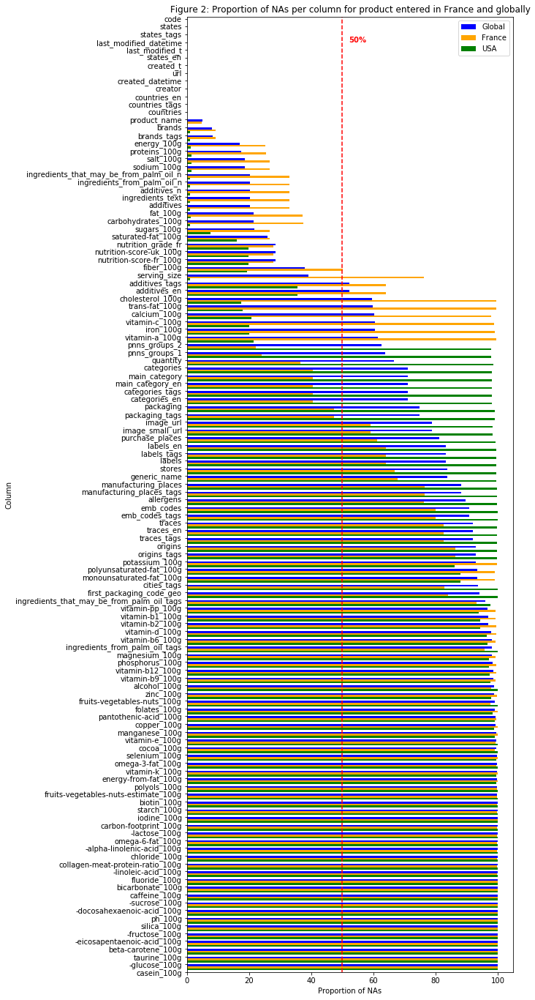

In [23]:
# Grouped barplot 

bar_size = 0.25
padding = 0.25

y_locs = np.arange(prop_NA_col_df.shape[0]) * (bar_size * 3 + padding)


fig, ax = plt.subplots(figsize=(8,24))

glob =ax.barh(y_locs, prop_NA_col_df["Proportion of NAs"], align='edge', height=bar_size, color = 'blue', label = 'Global') #left=prop_NA_col_df["Proportion of NAs"])
fr = ax.barh(y_locs + bar_size, prop_NA_col_df_france["Proportion of NAs"], align='edge', height=bar_size,
       color = 'orange', label = 'France')
us = ax.barh(y_locs + bar_size*2, prop_NA_col_df_usa["Proportion of NAs"], align='edge', height=bar_size,
       color = 'green', label = 'USA')

ax.set(yticks=y_locs, yticklabels=prop_NA_col_df.index, ylim=[0 - padding, len(y_locs)-40])

ax.set_title('Figure 2: Proportion of NAs per column for product entered in France and globally')
ax.set_xlabel('Proportion of NAs')
ax.set_ylabel('Column')
ax.invert_yaxis()
ax.axvline(x=50, linestyle = '--', color = 'red')
ax.text(52, 3, '50%', color = 'red', fontweight = 'bold')
plt.legend([glob, fr, us], ["Global", "France", "USA"])
plt.show()

We can see that the pattern of missing values is completely different for France and the USA. 
We can indeed see that we have almost no missing values in the USA for variables such as brands, energy, macro-nutrients composition (proteins, fats, carbohydrates), salt, ingredients that are/might be from palm oil and serving size, while we have at least 30% of missing values in France. We also have less than 40% of missing values in the USA for variables related to other micro-nutrients (vitamin-a, iron, calcium, etc), while these are mostly empty for products in france (almost 100% of missing values).  

On the contrary, informations on pnns groups, packaging, and categories have less missing values in France (less than 50%), while they are mostly incomplete in the USA. 

Finally, a fair amount of columns are equally empty for both countries. As mentionned earlier, variables with a lot of missing values are not very informative. A usual rule of thumb is to drop variables with more than 60/70% missing values, depending on the data and analyses performed. 

As the goal here is to explore and filter out the dataset to formulate interesting questions, the decision is made to apply a stronger filter and to drop all variables with more than 50% missing values for both the USA and France. 

In [24]:
#sum(prop_NA_col_df["Proportion of NAs"] < 50)
#to_drop = list(set(list(prop_NA_col_df.index[prop_NA_col_df["Proportion of NAs"] >= 50]) + list(prop_NA_col_df_france.index[prop_NA_col_df_france["Proportion of NAs"] >= 50]) + list(prop_NA_col_df_usa.index[prop_NA_col_df_usa["Proportion of NAs"] >= 50])))
to_drop = prop_NA_col_df.index[(prop_NA_col_df["Proportion of NAs"] >= 50) & 
                     (prop_NA_col_df_france["Proportion of NAs"] >= 50) &
                     (prop_NA_col_df_usa["Proportion of NAs"] >= 50)]




In [25]:
food_clean.drop(columns =to_drop, inplace = True)
food_clean.shape

(356001, 52)

We now have 356001 rows and 52 columns. 

In [26]:
print("Only {}% of missing values in the remaining dataset.".format(round(food_clean.isna().sum().sum()*100/(food_clean.shape[0]*food_clean.shape[1]), 2)))

Only 30.97% of missing values in the remaining dataset.


Now that we have applied a first filter on the columns, we are interested in finding out variables that are redundant. 

The remaining volumns in the dataset are: 

In [27]:
food_clean.columns.values

array(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'quantity', 'packaging', 'packaging_tags', 'brands', 'brands_tags',
       'categories', 'categories_tags', 'categories_en', 'countries',
       'countries_tags', 'countries_en', 'ingredients_text',
       'serving_size', 'additives_n', 'additives', 'additives_tags',
       'additives_en', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags',
       'states_en', 'main_category', 'main_category_en', 'energy_100g',
       'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g',
       'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
       'vitamin-a_100g', 'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g', 'nutrition-score-uk_100g'], dtyp

In [28]:
datetime_variables = ["created_datetime", "last_modified_datetime"]

Regarding the categorical variables, the following remain in the dataset: 

In [29]:
food_clean.select_dtypes('object').columns.values

array(['code', 'url', 'creator', 'product_name', 'quantity', 'packaging',
       'packaging_tags', 'brands', 'brands_tags', 'categories',
       'categories_tags', 'categories_en', 'countries', 'countries_tags',
       'countries_en', 'ingredients_text', 'serving_size', 'additives',
       'additives_tags', 'additives_en', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags',
       'states_en', 'main_category', 'main_category_en'], dtype=object)

We can see that some columns are actually the same info, conveyed 3 different ways. For example: 
* `categories`
* `categories_en`
* `categories_tags`

the first one probably corresponds to what is entered by the user, while the one with the `_en` ending corresponds to the english translation and the one with the `_tags` ending correspond to a shorten standardized tag. 

When possible, we will only keep the `_tags`variables, else, the `_en` variables and if none of these exist, we will keep the original variable. 


In [30]:
categorical_variables = ['code', 'creator', 'product_name', 
                         'quantity', 'packaging_tags', 'brands_tags',
                         'categories_tags','countries_tags', 'ingredients_text', 
                         'serving_size', 'additives_tags', 'nutrition_grade_fr',
                         'pnns_groups_1', 'pnns_groups_2', 'states_tags', 'main_category_en'
                        ]

Regarding the numeric variables, the ones still in the dataset are:

In [31]:
food_clean.select_dtypes('number').columns.values

array(['created_t', 'last_modified_t', 'additives_n',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g',
       'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g',
       'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
       'vitamin-a_100g', 'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g', 'nutrition-score-uk_100g'], dtype=object)

Among these, `created_t` is the same as `created_datetime` but in numeric instead of datetime. It makes sense to only keep the datetime one. 
The same goes for `last_modified`and `last_modified_datetime`. 

Finally, except for `nutrition-score-fr_100g` and `nutrition-score-uk_100g` and `salt_100g`and `sodium_100g`, all remaining numerical variables conveyed different information. 

The two following figures displays both couples of redundant information against each other: 

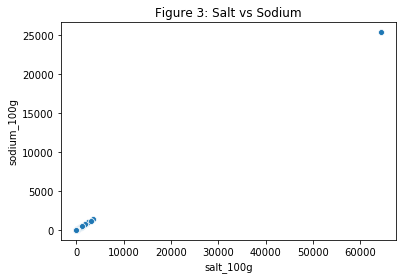

In [32]:
sns.scatterplot(x = 'salt_100g', y = 'sodium_100g', data = food_clean);
plt.title("Figure 3: Salt vs Sodium");

For `salt_100g`and `sodium_100g`, we can see that the correspondance is almost exact. Even though salt and sodium are not exactly the same thing, they are very closely related. 

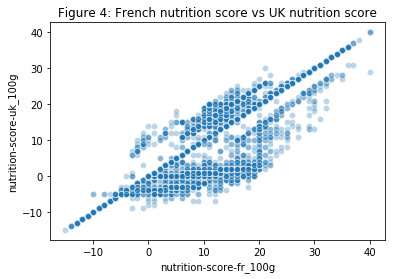

In [33]:
food_clean.sort_values(["nutrition_grade_fr", "countries_tags"], inplace = True)

sns.scatterplot(x = 'nutrition-score-fr_100g', 
                y = 'nutrition-score-uk_100g', 
                #hue = 'countries_tags',
                alpha = 0.3,
                data = food_clean);
plt.title("Figure 4: French nutrition score vs UK nutrition score");



Regarding `nutrition-score-fr_100g` and `nutrition-score-uk_100g`, we can see that while there is a positive correlation between the two scores, there are discrepancies.

Both are a measure of the gobal quality of the food. However, one (`nutrition-score-uk_100g`) was defined by the UK Food Safety Administrations (FSA), while the other (`nutrition-score-fr_100g`) was derived from the uk one, to better fit the french market. 

Understanding the reason behind these discrepancies could help us get a better understanding of the specificity of the food market in France and could be focus point in the next section. 
 

In [34]:
numeric_variables = [ 'additives_n',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g',
       'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g',
       'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
       'vitamin-a_100g', 'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g', 'nutrition-score-uk_100g']

In [35]:
food_clean = food_clean.filter(items= categorical_variables + datetime_variables + numeric_variables).copy()
food_clean.shape


(356001, 38)

In [36]:
summ_na_rows = food_clean.isna().sum(axis = 1)
prop_na_rows = summ_na_rows *100/food_clean.shape[1]

We now investigate the proportions of missing values per rows. The figure below displays their distribution. 

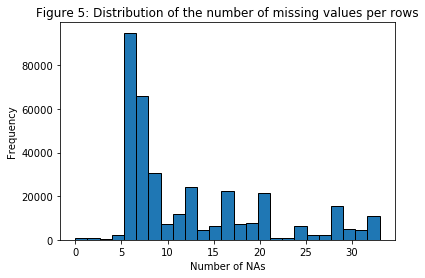

In [37]:
#Distribution of the number of missing values per rows
plt.hist(summ_na_rows,edgecolor = 'black', bins = 25);
plt.xlabel('Number of NAs')
plt.ylabel('Frequency')
plt.title('Figure 5: Distribution of the number of missing values per rows')
plt.show()

We can see that very few rows have 5 missing values or less. More than 50% have less than 10 missing values:

In [38]:
summ_na_rows.describe().T

count    356001.000000
mean     12.421676    
std      7.948422     
min      0.000000     
25%      6.000000     
50%      8.000000     
75%      17.000000    
max      33.000000    
dtype: float64

For now we keep all these rows as we will base further filtering on the variables we will decide to keep for the exploratory data analysis.

In [39]:
#setting "code" as the index
food_clean.set_index("code", inplace = True)

In [40]:
food_clean.head(2).T

code,8076802795019,3250391896554
creator,mitoita,binnette
product_name,Farina per tutte le preparazioni,Flocons d'Avoine
quantity,1 kg,500 g
packaging_tags,carta,"carton,papier"
brands_tags,"barilla,barilla-g-e-r-fratelli-spa-via-mantova-166-43122-parma-italy","chabrior,intermarche"
categories_tags,en:farina,"en:plant-based-foods-and-beverages,en:plant-based-foods,en:breakfasts,en:cereals-and-potatoes,en:cereals-and-their-products,en:breakfast-cereals,en:flakes,en:cereal-flakes,en:oat-flakes"
countries_tags,"en:albania,en:italy","en:algeria,en:belgium,en:france,en:poland,en:portugal"
ingredients_text,farina di grano tenero tipo &quot;00&quot;,Flocons d'_avoine_.
serving_size,NaN,40g
additives_tags,NaN,NaN


### A.c Duplicated values

We are now interested in knowing if we have any duplicated rows. If we considere only the `code`: 

In [41]:
print("{} duplicated codes.".format(food_clean.reset_index().duplicated('code').sum()))

0 duplicated codes.


As the codes are unique and probably automatically assigned, this doesn't mean we don't have duplicated products. 

How to define a duplicated product is something that can be a matter of discussion. This could be two identical rows (safe for the code), or it could be rows with the same values for a defined set of columns that could be used to identify uniquely a product (for example: `product_name`, `brand_tags`, `created_datetime`, etc.). 

For this project, we choose to define duplicated products as products sharing the same values on the categorical and datetime variables: 

In [42]:
print("{} duplicated products.".format(food_clean.duplicated(categorical_variables[1:] + datetime_variables).sum()))

647 duplicated products.


If we compare with complete duplicated rows:

In [43]:
print("{} duplicated rows.".format(food_clean.duplicated(food_clean.columns.values).sum()))

586 duplicated rows.


This means, that we have duplicated products with the same characteristics on the categorical variables, but not the same values on the numeric variables, which could be explained by errors for example. 

How to deal with these duplicated products is a matter of discussion, but for this project, we choose to keep the rows with the least missing values.  


In [44]:
# count the number of valid values per row
food_clean["N_na"] = food_clean.notnull().sum(axis=1)

# sort per number of valid values
food_clean.sort_values('N_na', inplace = True)

# keep duplicated rows which are the most complete
food_clean.drop_duplicates(categorical_variables[1:] + datetime_variables, keep='last', inplace=True)
food_clean.shape


(355354, 38)

### A.d Outliers and unacceptable values

We now look for outliers as well as unacceptable values. 
#### Quantitative variables

In [45]:
food_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
additives_n,283269.0,1.879468,2.502665e+00,0.00000,0.000000,1.000000,3.000000,3.000000e+01
ingredients_from_palm_oil_n,283269.0,0.023479,1.532515e-01,0.00000,0.000000,0.000000,0.000000,2.000000e+00
ingredients_that_may_be_from_palm_oil_n,283269.0,0.059823,2.808813e-01,0.00000,0.000000,0.000000,0.000000,6.000000e+00
energy_100g,294767.0,1125.440704,9.365942e+02,0.00000,384.000000,1092.000000,1674.000000,2.311990e+05
fat_100g,278897.0,56186.453074,2.966570e+07,0.00000,0.100000,5.300000,20.000000,1.566667e+10
saturated-fat_100g,263357.0,5.093511,7.965883e+00,0.00000,0.000000,1.790000,7.140000,5.500000e+02
trans-fat_100g,142962.0,0.073462,1.541220e+00,-3.57000,0.000000,0.000000,0.000000,3.690000e+02
cholesterol_100g,143705.0,0.020067,3.585335e-01,0.00000,0.000000,0.000000,0.020000,9.523800e+01
carbohydrates_100g,278621.0,56260.835446,2.968039e+07,0.00000,5.600000,20.000000,57.550000,1.566667e+10
sugars_100g,278699.0,15.669335,2.197292e+01,-17.86000,1.200000,5.400000,23.330000,3.520000e+03


We can see on the above table table, that some variables actually have a negative value for their minimum: `sugars_100g`, `fiber_100g`, `trans_fat_100g`, `vitamin-a_100g`, `vitamin-c_100g`,  `proteins_100g` and `nutrition-score-fr_100g`and `nutrition-score-uk_100`. While it might be possible to have negative nutrition score, it is unlikely that for the other variables, a negative value would be acceptable. 

On the other hand, we can also note that the max for some of the variables is very large (10^10), which would be unlikely. 

Finally, we can see that most of the values of `trans_fat_100g` are mostly 0 (more than 75% of non missing values). 

The following plot shows the distribution of the variables. 

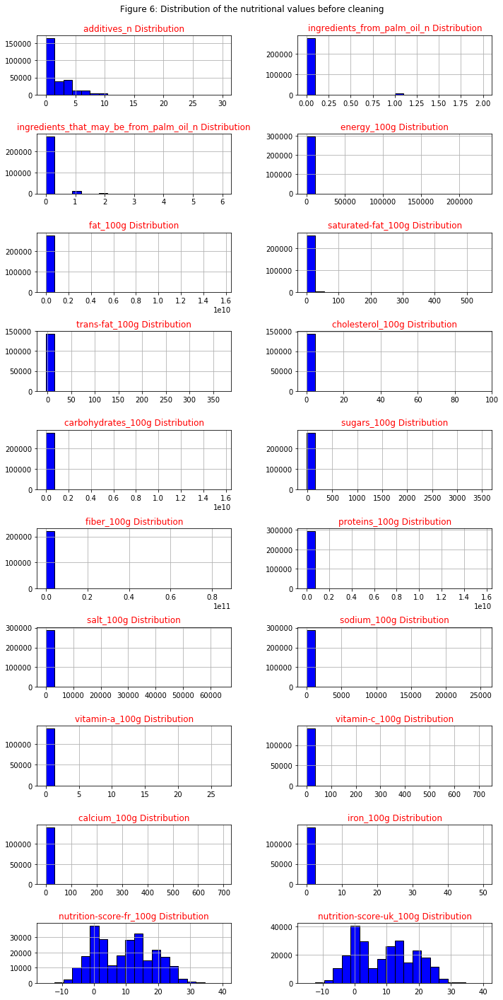

In [46]:
fig=plt.figure(figsize=(10,20))
for i, feature in enumerate(numeric_variables):
    ax=fig.add_subplot(len(numeric_variables)/2,2,i+1)
    food_clean[feature].hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #ax.boxplot(food_clean[feature].dropna())
    ax.set_title(feature+" Distribution",color='red')

fig.tight_layout()  
plt.suptitle("Figure 6: Distribution of the nutritional values before cleaning")
plt.subplots_adjust(top=0.95)
plt.show()


As we can see, for most of the variables, at the exception of `additives_n`, `ingredients_from_palm_oil_n` and `ingredients_that_may_be_from_palm_oil_n` which are counts and `nutrition-score-fr_100g`, the ditribution is completely flattened by the presence of outliers with anormally high values. 

In the next step, we will remove these values. 

For outliers, based on values in the describe() table, we can make the assumption that the data are generally not normally distributed since most of them have a very high number of 0 (more than 25% of the data), we prefer to use the IQR other the z-score method for outliers detection, as it is based on robust statistics. 

In [47]:
# select numeric variables that are not counts
actual_float_columns = [x for x in  numeric_variables if not re.findall(r'(_n)',x) ]

In [48]:
# create function to apply mask
def iqr(col): 
    q1 = col.quantile(0.25)
    q3 = col.quantile(0.75)
    iqr = q3-q1
    return [q1, q3, iqr]

def det_outlier(col): 
    lims = iqr(col)
    return (col<lims[0]-1.5*lims[2]) | (col>lims[1]+1.5*lims[2])

In [49]:
# apply mask to remove values outside of the IQR
food_clean[actual_float_columns] = food_clean[actual_float_columns].mask(food_clean[actual_float_columns].apply(lambda x: det_outlier(x)),np.nan).copy()

In [50]:
# apply mask to remove negative values in the columns other than the nutrition scores. 

food_clean[actual_float_columns[:-1]] = food_clean[actual_float_columns[:-1]].mask(food_clean[actual_float_columns[:-1]] < 0, np.nan).copy()

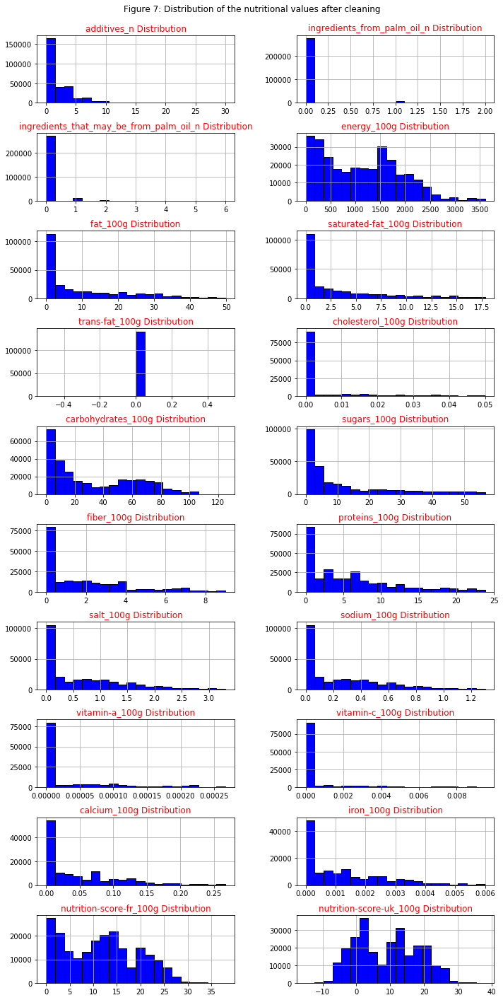

In [51]:
fig=plt.figure(figsize=(10,20))
for i, feature in enumerate(numeric_variables):
    ax=fig.add_subplot(len(numeric_variables)/2,2,i+1)
    food_clean[feature].hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #sns.histplot(food_clean, x=feature, hue="nutrition_grade_fr")
    #ax.boxplot(food_clean[feature].dropna())
    
    ax.set_title(feature+" Distribution",color='red')

fig.tight_layout()  
plt.suptitle("Figure 7: Distribution of the nutritional values after cleaning")
plt.subplots_adjust(top=0.95)  
plt.show()


After removing negative quantities and outlier values situated outside of the IQR for the quantitatives variables, we can now see their distributions without them being flattened. 

We can see that except for the scores, all variables have completely asymetrical distributions. 
Moreover, in the case of `energy_100g`and `carbohydrates_100g` and `nutrition-score-fr_100g` it looks like the data could be split in two subpopulations.

We also note that `trans-fat_100g`now have only 0 and will be dropped for further analyses.

Finally, we note that for `carbohydrates_100g`, some values are superior to 100, which should not be possible and are very likely mistakes that we decide to drop as well. 



In [52]:
# apply mask to remove values > 100 in carbohydrates_100g

food_clean["carbohydrates_100g"] = food_clean["carbohydrates_100g"].mask(food_clean["carbohydrates_100g"] > 100, np.nan).copy()

actual_float_columns.remove("trans-fat_100g")

As described by the Open Food Facts documentation, the scores and grades are computed based on the nutritional information. We are thus interested in knowing if the subpopulations observed in the histogramms can be related to the nutrition grades.

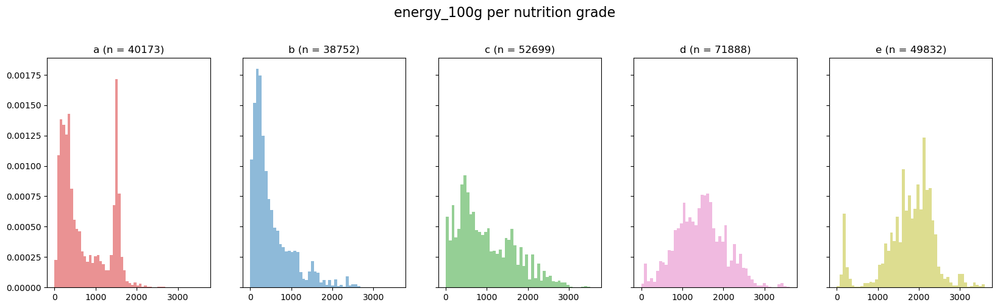

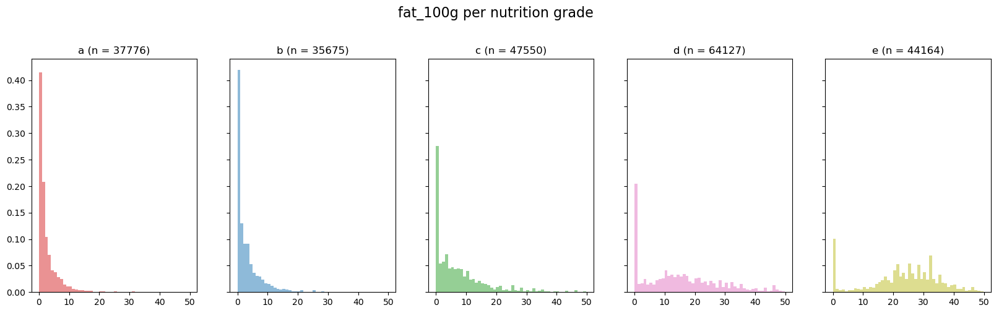

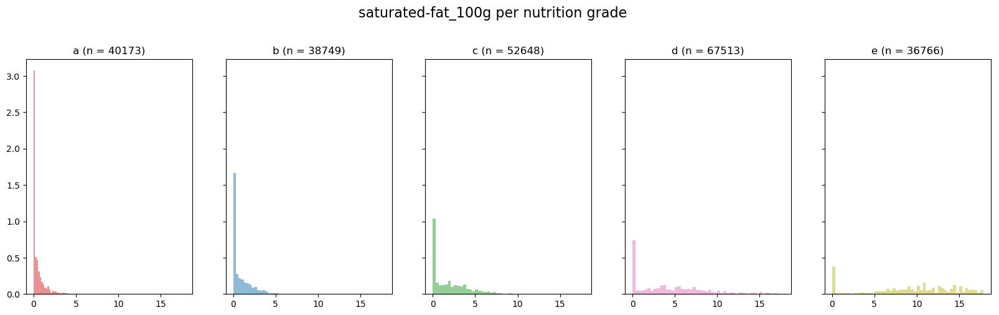

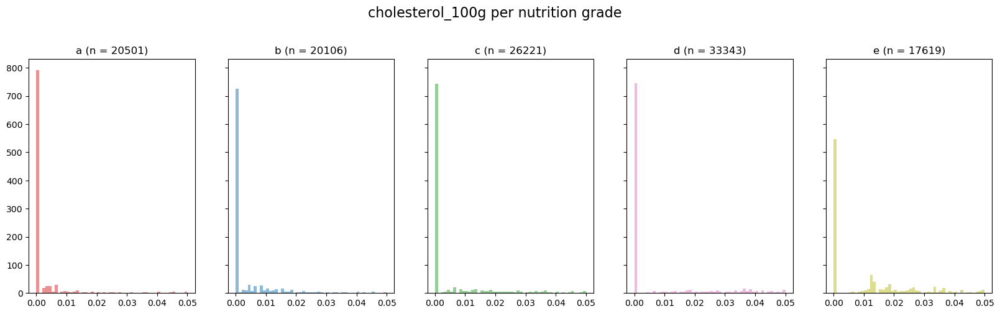

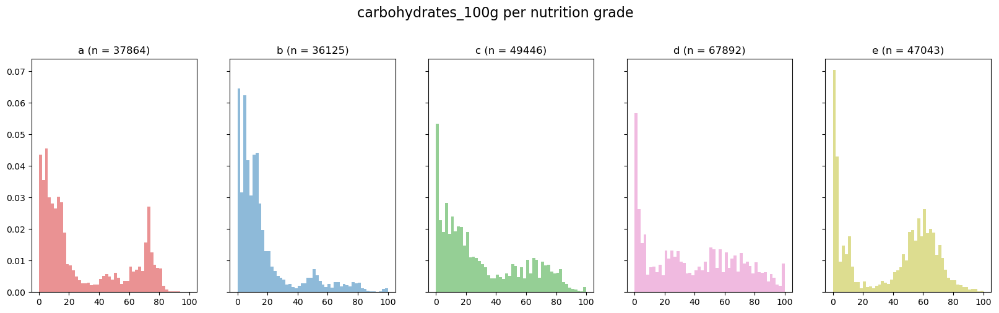

...

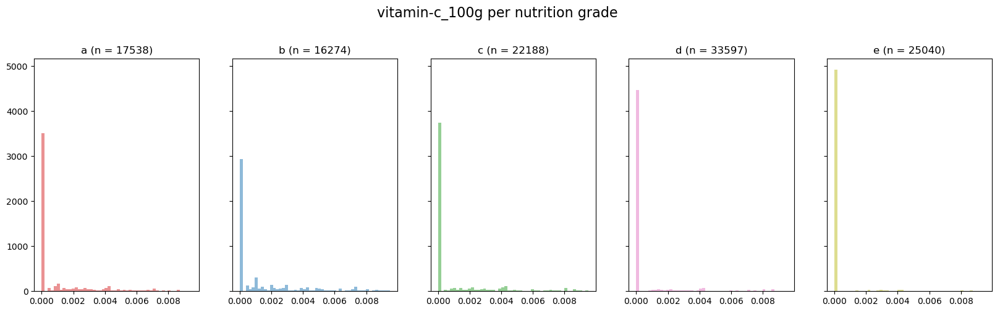

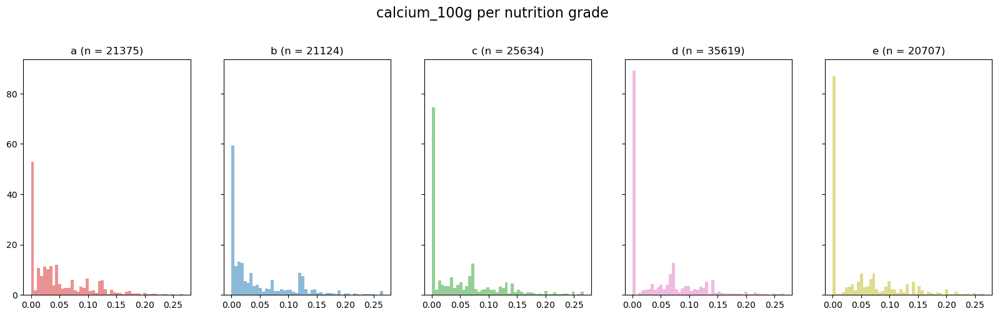

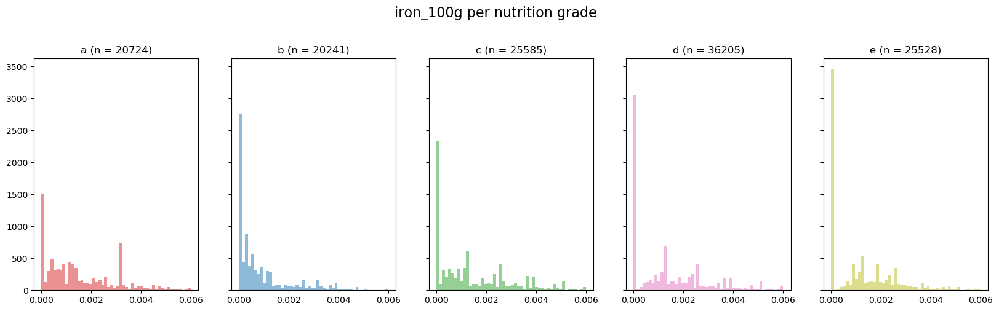

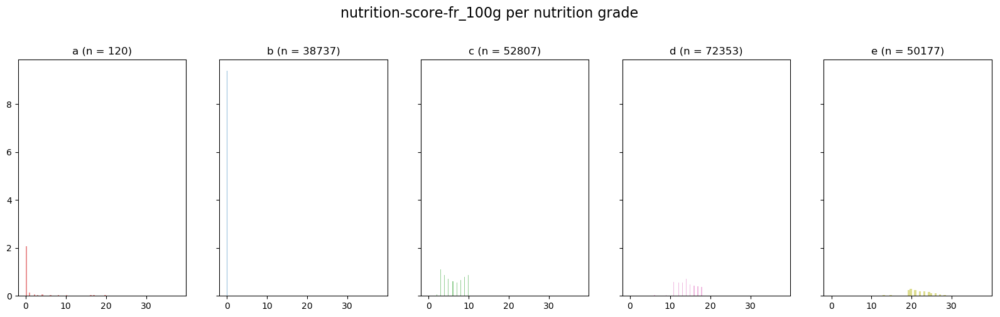

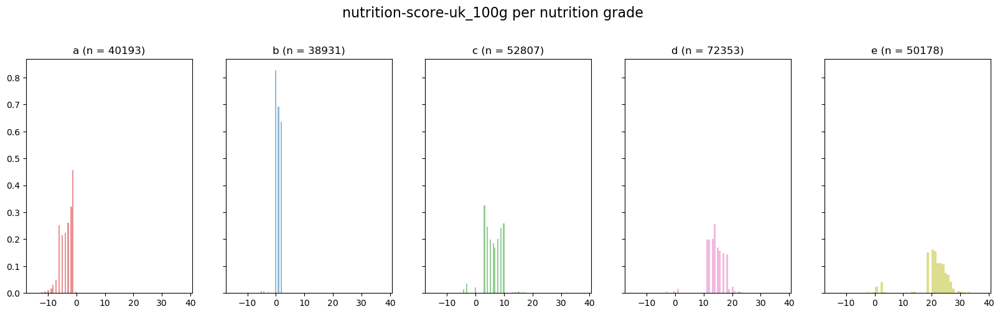

In [53]:
grades = sorted(food_clean["nutrition_grade_fr"].dropna().unique())

colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:pink', 'tab:olive']
for variable in actual_float_columns:
    fig, axes = plt.subplots(1, len(grades), figsize=(20,5), dpi=100, sharex=True, sharey=True)
    for idx, (ax, grade) in enumerate(zip(axes.flatten(), grades)): 
        ax.hist(food_clean.loc[(food_clean["nutrition_grade_fr"]==grade), variable].dropna(), 
                bins = 50, alpha = 0.5, 
                label = grade,
                density = True,
                color = colors[idx]
               )
        ax.set_title('{} (n = {})'.format(grade, food_clean.loc[(food_clean["nutrition_grade_fr"]==grade), variable].notna().sum()))

    plt.suptitle('{} per nutrition grade'.format(variable), y=1.05, size=16)
    plt.show

The first observation is that the products are not equally split among the nutrition grades. In general, the grades with the most products are the lower grades.

Secondly, we can see that the distribution of some of these variables is clearly different in function of the grades: 
* `energy_100g` have very different distributions per grades: grade a tend to follow a gamma distribution with a secong peak around 1500 kJ; Grade b and c seem to have a unique population following a gamma distribution. Distribution in grade d and e seem to mainly follow a normal distribution with a peak at 0. 
* `fat_100g`, `saturated_fat_100g`, `sugars_100g` and `salt_100g` all tend to have a similar pattern where all grades tend to have a population that follows a Gamma distribution, but for lower grades, we observe either a second peak at higher values, or at least a heavier tail. 
* `fiber_100g`and `proteins_100g`seem to have lower number of products with 0 for grade a than for other grades. 
* on the contraty, `carbohydrates_100g`seem to have the same distribution with two peaks across all grades. 

As a conclusion, even though nutrition grades seem to clearly be dependant on the nutritional information, this alone cannot explain the apparent subpopulations in the global distributions. 



Now that we have explored and further cleaned the numeric variables, we focus on the exploration of the categorical variables. 

Our first step is to display the top 10 entries for each of these variables in the figures below (we removed "states_tags" which is comprised of lists of tags and are very long strings that would render the figures unreadable. 

In [54]:
categorical_variables.remove("states_tags")

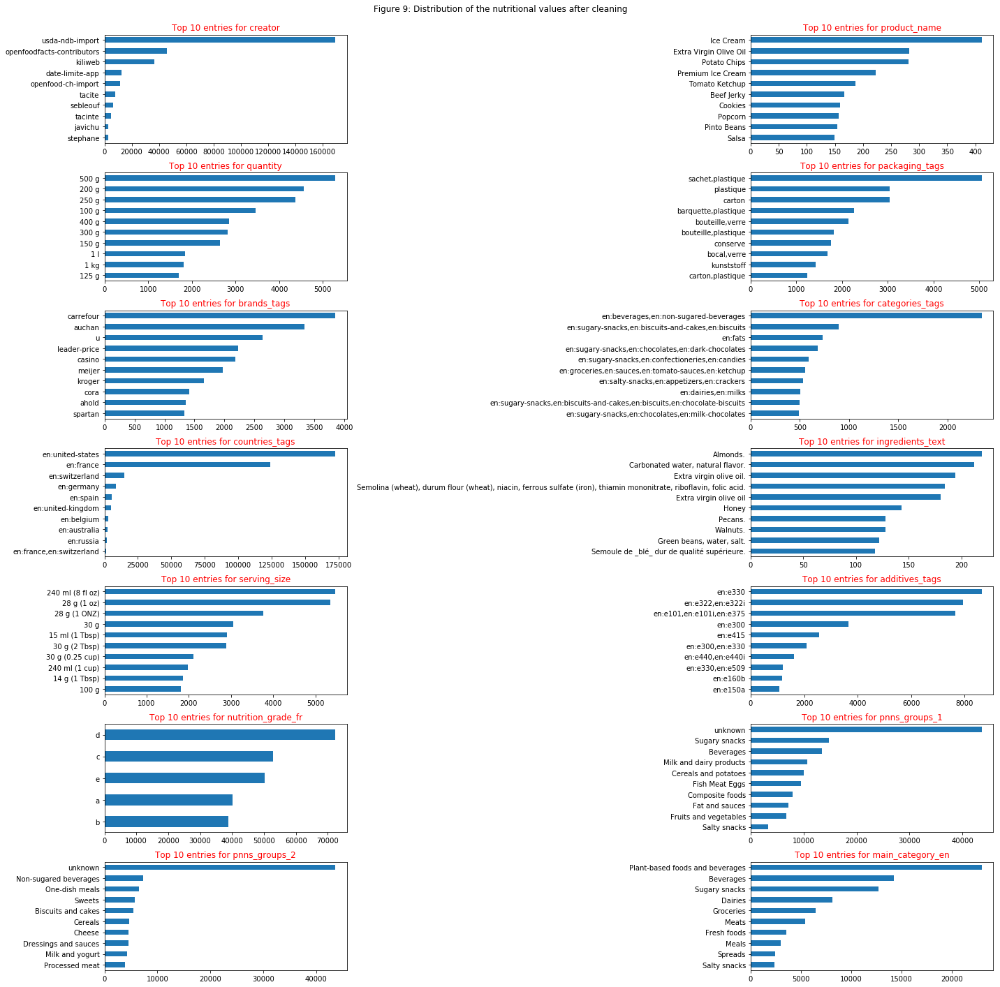

In [55]:

fig=plt.figure(figsize=(20,20))
for i, feature in enumerate(categorical_variables[1:]):
    ax=fig.add_subplot((len(categorical_variables))/2,2,i+1)
    #food_clean[feature].hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #sns.histplot(food_clean, x=feature, hue="nutrition_grade_fr")
    #ax.boxplot(food_clean[feature].dropna())
    top10 = pd.DataFrame(food_clean[feature].value_counts()).head(10)
    barplot = top10[feature].plot.barh()
    ax.set_title("Top 10 entries for " +feature,color='red')
    barplot.invert_yaxis()

fig.tight_layout()  
plt.suptitle("Figure 9: Distribution of the nutritional values after cleaning")
plt.subplots_adjust(top=0.95)  
plt.show()


We can see that some of these variables are actually lists: `packaging_tags`, `caterories-tags`, `countries_tags` and `additives tags`. 
The most common product in the dataset is Ice-cream. the most common country is the United States. The most common main category in "Plant based foods and beverages". 
The most common nutrition grade is d, followed by c, e, b and a. 

The next step is to identify if all of these variables are expressed with the same alphabet.

The following table displays the percentage of data that are not entered with an english recognised alphabet. 

In [56]:
# define function to check if a string only has latin letters 
def has_only_latin_letters(name):
    char_set = string.printable
    return all((True if x in char_set else False for x in name))


In [57]:
# define function to check if a string only has latin letters 
def has_only_latin_letters(name):
    char_set = string.printable
    if isinstance(name, float):
        name = ''
#        print(name)
    return all((True if x in char_set else False for x in name)) 


In [58]:

pd.DataFrame([(x, 100 -(food_clean[x].apply(has_only_latin_letters).sum() * 100/food_clean.shape[0])) for x in categorical_variables[1:]],
             columns = ["Column", "Percentage of non english entries"]
            )

,Column,Percentage of non english entries
0,creator,0.000000
1,product_name,16.299240
2,quantity,0.971988
3,packaging_tags,0.339098
4,brands_tags,0.416205
5,categories_tags,0.289570
6,countries_tags,0.010412
7,ingredients_text,25.601231
8,serving_size,0.402134
9,additives_tags,0.000000


We can see that `product_name`, `quantity`, `packaging_tags`, `brands_tags`, `categories_tags`, `countries_tags`, `ingredients_text`, `serving_size` and `main_category_en` all contain entries with non english recognized characters: 

In [59]:
#not_english = pd.DataFrame([(x,list(food_clean.loc[~food_clean[x].apply(has_only_latin_letters), x].value_counts().index[:10])) for x in categorical_variables[1:] if food_clean[x].apply(has_only_latin_letters).sum() <food_clean.shape[0]], 
#             columns = ["column", "entries"]
#            )


not_english = pd.DataFrame([(x,list(food_clean.loc[~food_clean[x].apply(has_only_latin_letters), x].value_counts().index[:10])) for x in categorical_variables[1:] if food_clean[x].apply(has_only_latin_letters).sum() <food_clean.shape[0]], 
             columns = ["column", "entries"]
            )
                           
not_english= pd.DataFrame(not_english["entries"].values.tolist(), index= not_english["column"]).add_prefix('entry_')


not_english
#[(x, food_clean[x].loc[food_clean[x].apply(has_only_latin_letters).sum() * 100/food_clean.shape[0])) for x in categorical_variables[1:]]

,entry_0,entry_1,entry_2,entry_3,entry_4,entry_5,entry_6,entry_7,entry_8,entry_9
column,,,,,,,,,,
product_name,Eau minérale naturelle,Lait demi-écrémé,Comté,Olives vertes dénoyautées,Macédoine de légumes,Mayonnaise à la moutarde de Dijon,Pâte à tartiner,Aceite de oliva virgen extra &quot;Esencia Andalusí&quot;,Carottes râpées,Pâte à tartiner aux noisettes
quantity,100 г,400 г,200 г,300 г,500 г,400 g (265 g égoutté),800 g (530 g égoutté),1 pièce,250 г,1 л
packaging_tags,"05-pp,♷","kunststoff,05-pp,♷","pet,♳","pet,einwegpfand,♳","pp,♷","пакет,5-pp","plastic,05-pp,♷",пластик,стеклянная-банка,пластиковая-бутылка
brands_tags,каждый-день,красная-цена,первым-делом,от-фермера,д,пекарня-марии,радостино,365-дней,простоквашино,домик-в-деревне
categories_tags,"en:dairies,en:milks,en:homogenized-milks,en:pasteurised-milks,ru:молоко-питьевое,en:uht-milks,ru:молоко-питьевое-пастеризованное,ru:молоко-питьевое-ультрапастеризованное,ru:молоко-питьевое-с-массовой-долей-жира-3-2-ультрапастеризованное","en:dairies,en:milks,en:pasteurised-milks,ru:молоко-питьевое,ru:молоко-питьевое-пастеризованное,ru:молоко-питьевое-с-массовой-долей-жира-2-5-пастеризованное","en:dairies,en:milks,en:homogenized-milks,en:pasteurised-milks,ru:молоко-питьевое,en:uht-milks,ru:молоко-питьевое-пастеризованное,ru:молоко-питьевое-ультрапастеризованное,ru:молоко-питьевое-с-массовой-долей-жира-2-5-ультрапастеризованное","en:dairies,en:milks,en:pasteurised-milks,ru:молоко-питьевое,ru:молоко-питьевое-пастеризованное,ru:молоко-питьевое-с-массовой-долей-жира-3-2-пастеризованное","en:beverages,en:alcoholic-beverages,en:beers,th:เบียร์","en:plant-based-foods-and-beverages,en:plant-based-foods,en:cereals-and-potatoes,en:cereals-and-their-products,en:flours,en:cereal-flours,en:bread-flours,en:wheat-flours,en:wheat-bread-flour,ru:мука-пшеничная-хлебопекарная-высший-сорт","en:beverages,en:carbonated-drinks,en:sodas,en:sugared-beverages,th:น้ำอัดลม","en:plant-based-foods-and-beverages,en:plant-based-foods,en:seafood,en:seaweeds-and-their-products,ru:салат-из-морской-капусты","en:sugary-snacks,en:biscuits-and-cakes,en:biscuits,ro:biscuiți","en:beverages,en:hot-beverages,en:coffees,en:instant-hot-beverages,en:instant-coffees,en:non-sugared-beverages,ru:кофе-натуральный-растворимый-сублимированный"
countries_tags,en:السعودية,en:日本,en:سلطنة-عمان,en:البحرين,en:भारत,other-日本,"en:japan,en:日本","en:united-states,en:other-日本,en:日本","en:france,en:العراق,en:المملكة-المتحدة",other-العراق
ingredients_text,Semoule de _blé_ dur de qualité supérieure.,100 % semoule de _blé_ dur de qualité supérieure.,"Semoule de _blé_ dur, eau.",Semoule de blé dur de qualité supérieure.,Natürliches Mineralwasser mit Kohlensäure versetzt,Lait demi-écrémé stérilisé UHT.,Semoule de _blé_ dur.,Eau minérale naturelle,Huile d'olive de catégorie supérieure obtenue directement des olives et uniquement par des procédés mécaniques.,Eau minérale naturelle.
serving_size,por ración 200 g,100ml de boisson prête à boire,60 g de pâtes sèches,Un carré (10 g),20 g (2 carrés),200 ml soit 1 verre (Cet emballage contient l'équivalent de 5 verres de 200 ml),Un carré (20 g),130 g (égoutté),10 g (1 à 2 tartines),110 g (égouttés)
main_category_en,Crêpes and galettes,ro:Branză,ja:スナック菓子,xx:Вафли,fr:Céleris Rémoulade,ru:Соус,ru:Кукурузные-палочки,ru:Выпечка,ro:Supă-instant,xx:Brød


The table above displays the top 10 entries with non english characters for each of these variables. We can see that they are written in several languages. Some are in French, which is not surprising as a fair amount of entries are french, others are in arabic, japanese, slavic, russian, etc. 

Finally, we investigate the datetime 2 variables:

In [60]:
# dropping the time and keeping only the date
food_clean["date_created_dt"] = food_clean["created_datetime"].dt.date

In [61]:
food_clean["date_created_dt"].head()

code
3948719255151    2016-12-03
5417146000392    2016-05-12
19043514         2017-03-03
4820184021280    2017-05-01
7702090017175    2015-07-01
Name: date_created_dt, dtype: object

In [62]:
nb_product_time = food_clean["date_created_dt"].value_counts()
nb_product_time.head()

2017-03-09    132137
2017-03-10    37723 
2017-02-07    11579 
2016-09-15    1563  
2015-02-28    689   
Name: date_created_dt, dtype: int64

In [63]:
nb_product_time.index = pd.to_datetime(nb_product_time.index)
nb_product_time.sort_values(ascending = True, inplace = True)

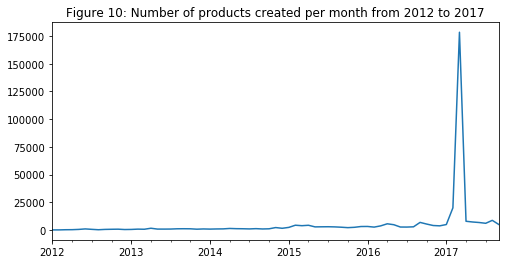

In [64]:
# Create the figure
plt.figure(figsize=(8, 4))

nb_product_time.resample('M').sum().plot(title = "Figure 10: Number of products created per month from 2012 to 2017")
#plt.set_title("Figure 10: Number of products created per month from 2017 to 2017")

plt.show()

In [65]:
#history of modifications
food_clean["last_modified_date"] = food_clean["last_modified_datetime"].dt.date

nb_product_modif_time = food_clean["last_modified_datetime"].dt.date.value_counts()
nb_product_modif_time.index = pd.to_datetime(nb_product_modif_time.index)
nb_product_modif_time.sort_values(ascending = True, inplace = True)

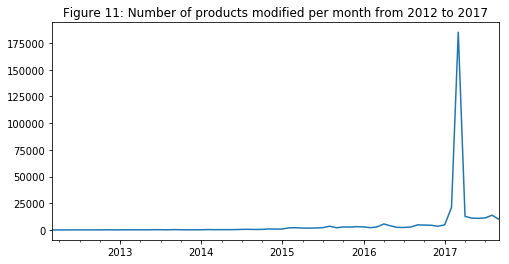

In [66]:
# Create the figure
plt.figure(figsize=(8, 4))

nb_product_modif_time.resample('M').sum().plot(title = "Figure 11: Number of products modified per month from 2012 to 2017")

plt.show()

On both figures 10 and 11, we can see that the majority of the products have been added or modified on the same date in march 2007. 
If we investigate the creator of these products, we can see that they were mostly created by the same creator: 

In [67]:

food_clean.loc[food_clean["date_created_dt"]== datetime.date(year=2017,month=3,day=9)].creator.value_counts()

usda-ndb-import               131798
kiliweb                       247   
openfoodfacts-contributors    54    
date-limite-app               15    
teolemon                      5     
agamitsudo                    4     
actarus-75                    2     
offheidelberg                 2     
smias                         2     
b7                            2     
anticultist                   2     
mikedafish                    1     
julie-yuka                    1     
guigzz                        1     
flo25                         1     
Name: creator, dtype: int64

#### Conclusions on data wrangling
During this section, we have filtered out the variables with the most information, eliminated duplicates, outliers and extreme values. We also took a first look at the data, and showed that most of the nutritional information (quantitative variables) don't follow a Normal distribution. Moreover, they often have a distribution that varies according to the nutrition grade, with sometimes what appear to be subpopulations within the grades. As the nutrition grades are computed based on teh nutritional information, having distributions being different between grades, is not surprising. However, having subpopulations within groups might be a sign that other factors might be at play and be linked to the nutrition grades. 

This is an aspect that we are willing to investigate further in the next step of this project. 

## B. In depth analysis

In order to explore further the nutrition scores and grades, we aim at answering the 3 following questions:
1. Can we explain the discrepancies between the French and the UK nutrition score? 
2. What are the top main categories of products in each grade?
3. Is there a link between the nutrition grade and the number of ingredients originating from palm oil? 


To answer these questions, we chose to work with a subset of our dataset, keeping the following columns: 
`nutrition_grade_fr`, `nutrition-score-fr_100g`, `nutrition-score-uk_100g`, `ingredients_from_palm_oil_n` and  `ingredients_that_might_be_from_palm_oil_n`. 
As mentionned earlier, the dataset contains a lot of missing values and how to deal with them is an important matter of discussion:
* Option one would be to impute them. For now, we don't really have any knowledge of machine learning algorithms to use knowledge from the data to replace the missing values based on similar data, or using techniques such as multiple imputation. One other option, would be to replace them by the mode of each variables for categorical variables, or the mean for the numeric variables. However, as the number of missing data is quite important, this would drastically reduce the variability in the data, with some specific values being overrepresented, in a way that would modify the actual data distribution. Moreover, it could be that the missing values would actually be '0' for the numeric variables. 
* Option two would be to drop completely missing values. This leads to a loss of information and means that we cannot really generalize our conclusions. 
As this is an exploratory data analysis and we do not aim at creating a model, we chose the simple solution of dropping missing values for the specific questions we will answer. This solution has the inconvenient of not having a single dataset on which to perfrom the whole analysis. However, it allows us to lose the least information to answer each of our questions. 

In [68]:
eda_df = food_clean.loc[:,["nutrition_grade_fr", "countries_tags",
                           "nutrition-score-fr_100g", "nutrition-score-uk_100g", 
                           "ingredients_from_palm_oil_n", "ingredients_that_may_be_from_palm_oil_n", 
                           "main_category_en"]].copy()




In [69]:
eda_df.columns

Index(['nutrition_grade_fr', 'countries_tags', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'main_category_en'],
      dtype='object')

### B.1) Discrepancies between the French nutrition score and the UK nutrition score
Our first point of focus is the discrepancies we observed between the French and the UK nutrition scores. 
As the food market can be country specific, we chose to focus this analysis on the two following countries: France and the USA. 
Firstly, these 2 countries constitutes more than 83% of the countries in the dataset. Secondly, the French nutrition score was developped for the French market, while considering the closeness of culture between the USA and the UK, we make the assumption that the UK nutrition score would be accurate for USA products. Finally, by excluding products with more than 1 country tag, we ensure that the score is representative of one country market and not of a mixture of multiple of them. 

In [70]:
eda_df["countries_tags"].value_counts().head()

en:united-states    172535
en:france           123980
en:switzerland      14912 
en:germany          8470  
en:spain            5529  
Name: countries_tags, dtype: int64

In [71]:
scores_df = eda_df.loc[(food_clean['countries_tags'] == 'en:france') | (food_clean['countries_tags'] == 'en:united-states'),
                       ["nutrition_grade_fr", "countries_tags", "nutrition-score-fr_100g", "nutrition-score-uk_100g", "main_category_en"]
                      ]
scores_df.shape

(296515, 5)

In [72]:
scores_df.dropna(subset = ["nutrition_grade_fr", "countries_tags", "nutrition-score-fr_100g", "nutrition-score-uk_100g"],inplace=True)
scores_df.shape

(191927, 5)

<Figure size 1152x1152 with 0 Axes>

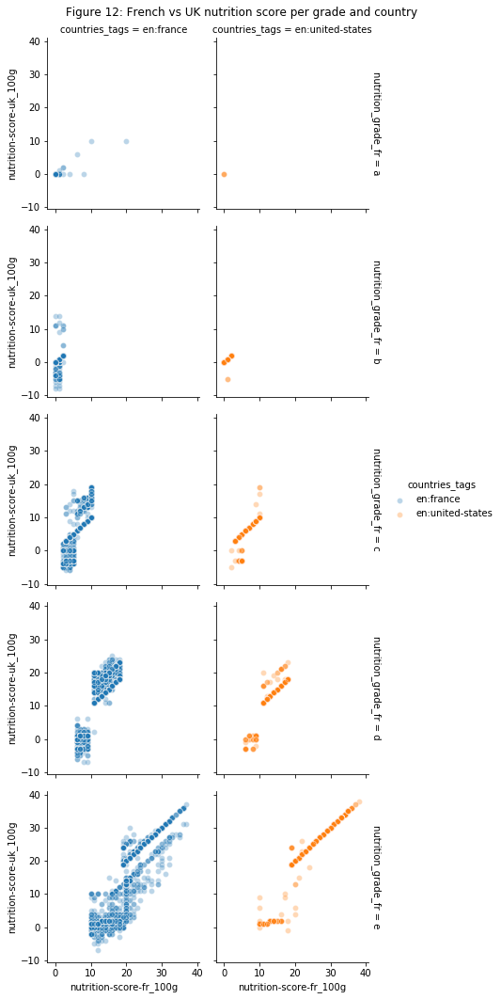

In [73]:
scores_df.sort_values("nutrition_grade_fr", inplace = True)
plt.figure(figsize=(16, 16))
g = sns.FacetGrid(scores_df, 
                  row="nutrition_grade_fr", 
                  col = "countries_tags",
                  hue="countries_tags",
                  margin_titles=True
                 );
g.map(sns.scatterplot, 'nutrition-score-fr_100g', 'nutrition-score-uk_100g', alpha=.3);
g.fig.suptitle('Figure 12: French vs UK nutrition score per grade and country');
plt.subplots_adjust(top=0.95);
g.add_legend();

If we consider only products in France and the USA, we can see that in general, we tend to have more discrepancies in France. This is not surprising as the french score was created to better fit the French market and we would expect that it was because the UK grading was found to be unaccurate in France. 
We can also see that we tend to have more discrepancies for lower grades (grade c, d, e) than for higher grades (a,b). 

To further understand, we investigate the main categories for the products with the largest discrepancies (>5). As the `main_category_en` column has a lot of missing values, we chose to replace them with: 'Not Available' to lose the least amount of information.


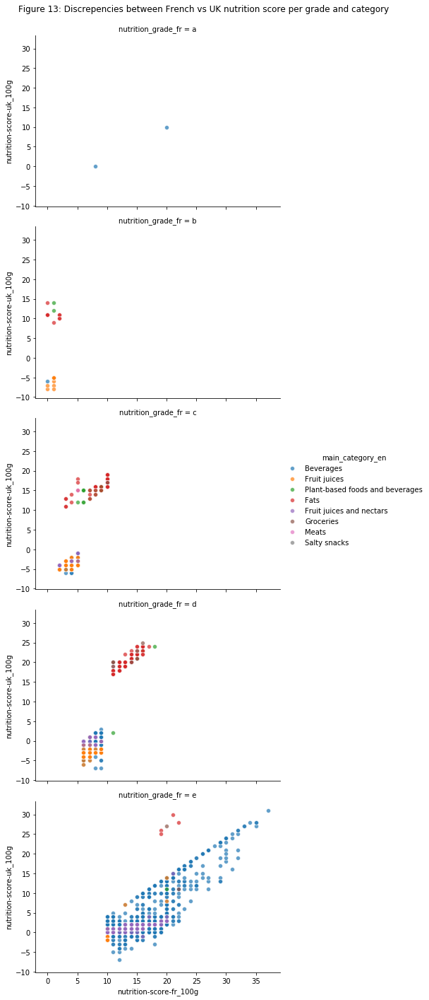

In [74]:
scores_df.fillna(value = 'Not Available', inplace = True)
scores_df.sort_values("nutrition_grade_fr", inplace = True)
g = sns.FacetGrid(scores_df.loc[(np.abs(scores_df['nutrition-score-fr_100g'] - scores_df['nutrition-score-uk_100g']) > 5)], 
                  row="nutrition_grade_fr",
                  hue="main_category_en", 
                  height = 4, 
                  aspect = 1.5
                 )
g.map(sns.scatterplot, 'nutrition-score-fr_100g', 'nutrition-score-uk_100g', alpha=.7)
g.fig.suptitle('Figure 13: Discrepencies between French vs UK nutrition score per grade and category');
plt.subplots_adjust(top=0.95)
g.add_legend()

First, we can see that the products with the highest discrepancies are products where the main category was not missing, as the "Not Available" category does not appear on the figure. 

More importantly, we can see that products with main category: 'fats' and 'plant based foods and beverages' tend to be better graded in France, while 'beverages' and 'fruit juices and nectars' tend to have a lower score with the French formula. This could be explained by the fact that the latter products may contains high amounts of sugars which is a penalising factor in the french formula.  

### B.2) Top main categories of products in each grade
Our second objective is to investigate the top main categories in each grade. 
To this end, we chose this time to only keep products where `main_category_en` and `nutrition_grade_fr` are non-missing. 

In [75]:
top_categories = eda_df.loc[:,["main_category_en","nutrition_grade_fr"]].copy()
top_categories.dropna(inplace = True)

In [76]:
top_categories.shape

(74917, 2)

In [77]:
# Group by nutrition grades and compute counts per main categories
top_categories = pd.DataFrame(top_categories.groupby("nutrition_grade_fr").main_category_en.value_counts())
top_categories.columns = ["n"]
top_categories.reset_index(inplace = True)
top_categories.head()
final_top_categories = top_categories.groupby(["nutrition_grade_fr"]).apply(lambda x : x.sort_values(by = 'n', ascending = False).head(5))

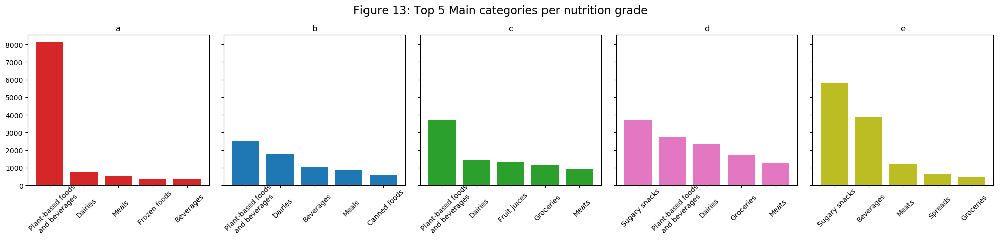

In [78]:
colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:pink', 'tab:olive']
fig, axes = plt.subplots(1, len(grades), figsize=(20,5), dpi=100, sharex=False, sharey=True)
final_top_categories["main_category_en"] = [ '\n'.join(wrap(l, 20)) for l in final_top_categories.main_category_en]
for idx, (ax, grade) in enumerate(zip(axes.flatten(), grades)): 
    #labels = [ '\n'.join(wrap(l, 20)) for l in df.name]

    ax.bar(final_top_categories.loc[final_top_categories["nutrition_grade_fr"]==grade, "main_category_en"],final_top_categories.loc[final_top_categories["nutrition_grade_fr"]==grade, "n"], 
           #bins = 20, alpha = 0.5, 
           label = grade,
           color = colors[idx]
          )
    ax.set_title(grade)
    plt.setp(ax.get_xticklabels(), rotation=45, wrap = True, horizontalalignment="center", fontsize = 10)
    ax.tick_params(axis='x', which='major', pad=25)
    plt.tight_layout()
    #ax.set_xlabel("main_category_en")
    

    plt.suptitle('Figure 13: Top 5 Main categories per nutrition grade', y=1.05, size=16)
    plt.show

We can see that the top categories are very different between the extreme categories: The top categories for grade a are "Plant based foods and beverages", "Dairies", "Meals" , "Frozen foods" and "Beverages". In contrast, for grade e, the top categories are "Sugary snacks", "Beverages", "Meats", "Spreads" and "Groceries".  

For the other grades, the top categories are an overlap of common categories, but we can say that 'Plant based foods and beverages', 'Dairies' and 'Meals' tend to have better nutrition grades in general, while 'Sugary snacks', 'Meats' and 'Groceries' tend to have poorer nutrition grades. 

## B.3) Relationship between ingredients from/ingredients that might be from palm oil and nutrition grade 

Finally, our last goal is to investigate the relationship between nutrition grade and the number of ingredients that are or might be from palm oil. 

To this end, we start by summing `ingredients_from_palm_oil_n`and `ingredients_that_may_be_from_palm_oil_n` to get a single variable. 

In [79]:
palmoil = eda_df.loc[:,["ingredients_from_palm_oil_n","ingredients_that_may_be_from_palm_oil_n","nutrition_grade_fr"]].copy()
palmoil.dropna(inplace = True)
palmoil["palm_oil_total"] = palmoil["ingredients_from_palm_oil_n"] + palmoil["ingredients_that_may_be_from_palm_oil_n"]

palmoil["palm_oil_total"].value_counts()

0.0    213425
1.0    13026 
2.0    2533  
3.0    599   
4.0    106   
5.0    28    
6.0    1     
Name: palm_oil_total, dtype: int64

In [80]:
palmoil.shape

(229718, 4)

We can see that the new variable `palm_oil_total` is a discrete quantitative variable that ranges from 0 to 6.

The question we want to answer is: Is the number of ingredients (potentially) from palm oil, independant from the nutrition grade? 
If we transform `palm_oil-total`into a categorical variable, we can use a chi square test of independance to answer this question. 

#### Hypotheses: 
* H0: The number of ingredients that are or might be from palm oil and the nutrition grade are independant. In this case, we expect all grades to have a similar distribution of the palm oil ingredients. 
* H1: The number of ingredients that are or might be from palm oil and the nutrition grade are *NOT* independant. In this case, the distribution of the number of palm oil ingredients, would be different between the grades. 

#### Test significance
We chose to compute the test with a significance of 5%, meaning that if the p-value is <0.05, there is less than 5% that we observed these distributions at random.

#### Collecting the data: 
We chose to split `palm_oil_total`into 3 categories: '[0-0], [1-2] and [3-6], in order to have enough products in each categories (a minimum of 5 observations per cell of the contengency table is needed to perform the Chi square test). 


In [81]:
bins = pd.IntervalIndex.from_tuples([(0, 0), (1, 2), (3, 6)], closed = 'both')
names = ['0', '[1-2]', '[3-6]']

palmoil['categ_n'] = pd.cut(palmoil['palm_oil_total'], bins, labels=names)
palmoil.head()

,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,palm_oil_total,categ_n
code,,,,,
0073469305016,0.0,0.0,b,0.0,"[0, 0]"
8710398603319,0.0,0.0,b,0.0,"[0, 0]"
3596710336531,1.0,0.0,b,1.0,"[1, 2]"
0070784152264,0.0,0.0,b,0.0,"[0, 0]"
0074714084076,0.0,0.0,b,0.0,"[0, 0]"



The table below displays the observed distribution of the values between the grades in the dataset:


In [82]:
palmoil_categ = pd.DataFrame(palmoil.groupby(by = ["nutrition_grade_fr"])[ "categ_n"].value_counts())
palmoil_categ.columns = ["n"]
palmoil_categ.reset_index(inplace=True)
palmoil_categ_pivot = palmoil_categ.pivot_table(index=["categ_n"], 
                    columns='nutrition_grade_fr', 
                    values='n')
palmoil_categ_pivot

nutrition_grade_fr,a,b,c,d,e
categ_n,,,,,
"[0, 0]",35748,33368,44242,59440,40627
"[1, 2]",804,1507,3193,5656,4399
"[3, 6]",38,29,130,332,205


We can now perform the test: 

In [83]:
#Chi square test of independance
import scipy.stats as stats
chi2, p, dof, ex = stats.chi2_contingency(palmoil_categ_pivot, correction=False)

In [84]:
print("The number of degrees of freedom is: {}".format(dof))

print("Test statistic is: {}".format(chi2))


print("p-value is:{}".format(p))

if p<0.05: 
    print("Hypothesis H0 is rejected with a significance level of 5%: Nutrition grade and number of palm oil ingredients are not independant.")
else: 
    print("We cannot reject H0. The collected data does not allow us to determine wether nutrition grade and number of palm oil ingredients are independant.")

The number of degrees of freedom is: 8
Test statistic is: 2771.6560827323756
p-value is:0.0
Hypothesis H0 is rejected with a significance level of 5%: Nutrition grade and number of palm oil ingredients are not independant.


It looks like nutrition grade and number of palm oil ingredients are not independant. To illustrate this, the grouped barplot below displays the observed and expected values in each categories. 

In [85]:
exp_df = pd.DataFrame(ex, index = ['[0, 0]', '[1, 2]', '[3, 6]'],
                      columns = ['a', 'b', 'c', 'd', 'e']
                     ).T
exp_df

,"[0, 0]","[1, 2]","[3, 6]"
a,33994.814294,2478.272534,116.913172
b,32428.395685,2364.078287,111.526028
c,44191.400434,3221.618833,151.980733
d,60787.447653,4431.495364,209.056983
e,42022.941933,3063.534982,144.523085


In [86]:
obs_df = palmoil_categ_pivot.T 
obs_df.columns = ['[0, 0]', '[1, 2]', '[3, 6]']
obs_df

,"[0, 0]","[1, 2]","[3, 6]"
nutrition_grade_fr,,,
a,35748,804,38
b,33368,1507,29
c,44242,3193,130
d,59440,5656,332
e,40627,4399,205


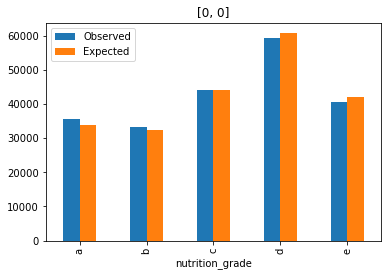

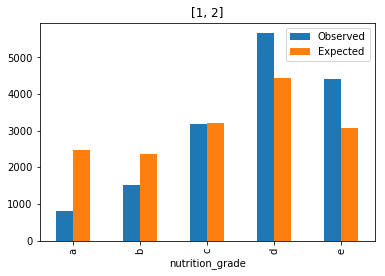

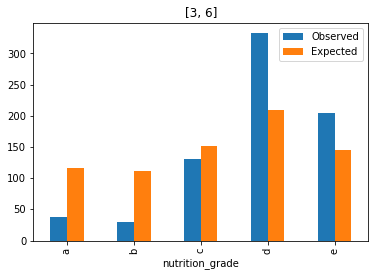

In [87]:
n_palmoil = ['[0, 0]', '[1, 2]', '[3, 6]']

for idx, (ax, n) in enumerate(zip(axes.flatten(), n_palmoil)): 
    #labels = [ '\n'.join(wrap(l, 20)) for l in df.name]
    
    df = pd.merge(obs_df[n], 
                  exp_df[n], 
                  right_index= True, left_index = True).reset_index()
    df.columns = ["nutrition_grade", "Observed", "Expected"]
    
    df.plot(x="nutrition_grade", y=["Observed", "Expected"], kind="bar", title = n)

    plt.show



We can see that while the observed and expected values are distributed equally amongs products with 0 ingredients from palm oil, this is not the case for higher numbers of palm oil ingredients, where the dataset contains less products of higher grades than expected and more products with lower grades than expected.

In conclusion, products with lower nutrition grades tend to have a higher number of ingredients that are or may be from palm oil. 

#### B.4) General conclusions on the in-depth analysis: 

During this section, we aimed at investigating the nutrition scores and grades in our dataset. We establisehd that the differenceof formula to compute the nutrition score in France and in the UK lead to some categories of product, such as 'Fruit juices and Nectars' and 'Beverages' to be graded with a lower score in France. 
We also showed that some categories of products tend to be systematically graded lower than others. For example, 'Sugary snacks' have lower grades than 'Plant based food and beverages'. 
Finally we showed that the number of ingredients that are or may be from palmoil si not independant from the nutrition grade, as products with a better score, tend to contain less palmoil ingredients. 

However, these results are to be taken with a grain of salt. The dataset originally contained a lot of missing and extreme/incorrect values, that were dropped before analysis. A way of improving the analysis would be to impute the data instead of dropping them. 
One option would have been to replace missing values for categorical values with "Not Available". However, due to the high number of missing values, this category would have accounted for a large number of observations and would have render categorical plots unreadable. Another way would have been to use machine learning algorithms. This will be an option that we will explore in the future, when we will have more knowlegde on this subject. 

We will now perform the more supervised tasks of the project. 

### C. Text data

In this section, the goal is to find the 5 most common ingredients in the dataset. 
Our process for this task is as follow:
* split the ingredients column to accounts for all listed ingredients
* homogenise the entry: same case, strip punctuation
* create a dictionnary of ingredients to count them

As, we have established earlier that the entries could be written in different languages, we will display the top 5 ingredients: 
* globally
* in France 
* in the United States

In [88]:
def rep_punctuation(text): 
    for c in string.punctuation: 
        if c in text: 
            text = text.replace(c, '')
    return text

In [89]:
dict_ingredients_glob = {}
dict_ingredients_fr = {}
dict_ingredients_usa = {}
for idx, product in food_clean.iterrows(): 
    if isinstance(product["ingredients_text"], str):
        lst_ing = [rep_punctuation(s.lower().split(':')[-1].strip()) for s in product["ingredients_text"].replace('(', ',').split(',')]
        for ing in lst_ing: 
            if ing in dict_ingredients_glob: 
                dict_ingredients_glob[ing] +=1
            else: 
                dict_ingredients_glob[ing] = 1
            if isinstance(product["ingredients_text"], str) & (product["countries_tags"] == "en:france"):
                if ing in dict_ingredients_fr: 
                    dict_ingredients_fr[ing] +=1
                else: 
                    dict_ingredients_fr[ing] = 1
            elif isinstance(product["ingredients_text"], str) & (product["countries_tags"] == "en:united-states"): 
                if ing in dict_ingredients_usa: 
                    dict_ingredients_usa[ing] +=1
                else: 
                    dict_ingredients_usa[ing] = 1
        

In [90]:
sorted(dict_ingredients_glob.items(), key=lambda x: x[1], reverse=True)[:5]

[('salt', 104269),
 ('sugar', 77787),
 ('water', 72678),
 ('sel', 49078),
 ('sucre', 39188)]

In [91]:
sorted(dict_ingredients_fr.items(), key=lambda x: x[1], reverse=True)[:5]

[('sel', 46201),
 ('eau', 34118),
 ('sucre', 32727),
 ('farine de blé', 11070),
 ('acide citrique', 8494)]

In [92]:
sorted(dict_ingredients_usa.items(), key=lambda x: x[1], reverse=True)[:5]

[('salt', 101754),
 ('sugar', 75502),
 ('water', 70785),
 ('citric acid', 32451),
 ('folic acid', 20892)]

As expected, the top 5 ingredients globally are actually the same top ingredients in France and in the United States but in different languages: Salt, sugar and water. In France, in addition to salt water and sugar, the é other ingredients of the top5 are wheat flour and citric acid. In the UA, they are citric acid and folic acid. 

### D. Time series analysis
The goal of this section is to investigate more closely the `created_datetime` and `last_modified_datetime` variables. First, we will analyze the mean time difference between these two values. And second, we will analyze the total number of items created each month over the full timeline of the data. 

In [93]:
food_clean["diff_time"] = food_clean["last_modified_datetime"] - food_clean["created_datetime"]
print("In average, there is {} between creation of a product and its last modification.".format(food_clean["diff_time"].mean()))

In average, there is 108 days 08:16:55.389671 between creation of a product and its last modification.


The figure below overlaps the number of products created and modified, downsampled to months.


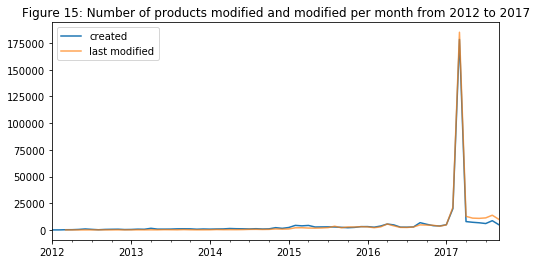

In [94]:
# Figure: 

# Create the figure
plt.figure(figsize=(8, 4))

nb_product_time.resample('M').sum().plot(title ="Figure 15: Number of products modified and modified per month from 2012 to 2017")
nb_product_modif_time.resample('M').sum().plot(alpha= 0.7)
#nb_product_time.plot()
#nb_product_modif_time.plot()
plt.legend(['created', 'last modified'], loc='upper left')
plt.show()


As established in the first part of this project, we can see that most of the products have been created and last modified during 2017. 
To better illustrate this, the following figure shows the number of products created and modified per day, starting from beginning of 2017: 

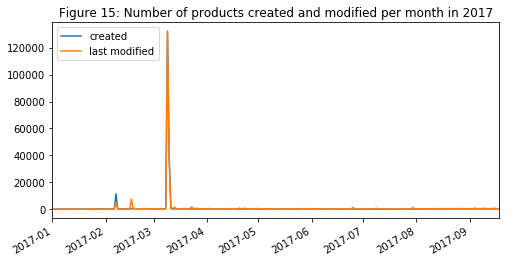

In [95]:
# Create the figure
plt.figure(figsize=(8, 4))


nb_product_time[nb_product_time.index[(nb_product_time.index.year ==2017)]].plot(title ="Figure 15: Number of products created and modified per month in 2017")
nb_product_modif_time[nb_product_modif_time.index[(nb_product_modif_time.index.year ==2017)]].plot()
plt.legend(['created', 'last modified'], loc='upper left')
plt.show()

As established in section A, this high number of products added in March of 2017, is due to a massive upload by the usda. 
To better visualize the number of products added and modified in the dataset, we decide to exclude the products entered by the usda.


In [96]:
time_df = food_clean.loc[food_clean["creator"]!='usda-ndb-import',:].copy()
time_df.shape

(186110, 41)

In [97]:
#history of creation

no_usda_nb_product_time = time_df["created_datetime"].dt.date.value_counts()
no_usda_nb_product_time.index = pd.to_datetime(no_usda_nb_product_time.index)
no_usda_nb_product_time.sort_values(ascending = True, inplace = True)

#history of modifications
no_usda_nb_product_modif_time = time_df["last_modified_datetime"].dt.date.value_counts()
no_usda_nb_product_modif_time.index = pd.to_datetime(no_usda_nb_product_modif_time.index)
no_usda_nb_product_modif_time.sort_values(ascending = True, inplace = True)

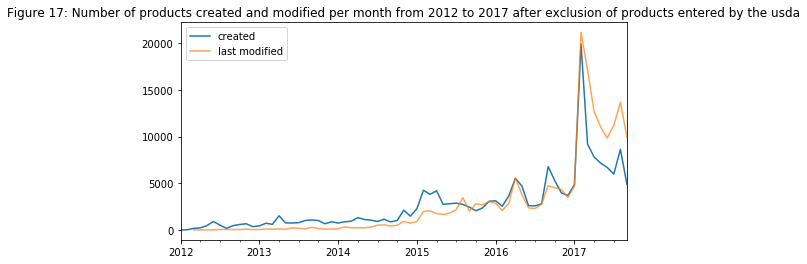

In [98]:
# Figure: 

# Create the figure
plt.figure(figsize=(8, 4))

no_usda_nb_product_time.resample('M').sum().plot(title ="Figure 17: Number of products created and modified per month from 2012 to 2017 after exclusion of products entered by the usda")
no_usda_nb_product_modif_time.resample('M').sum().plot(alpha= 0.7)
#nb_product_time.plot()
#nb_product_modif_time.plot()
plt.legend(['created', 'last modified'], loc='upper left')
plt.show()


We can see that before 2017, there is generally more products that are created than products that are modified. However, starting from 2017, it is the opposite. We can also see that there is no shift in peaks for creation and modification. This gives an hindsight on the users behaviour, as it means that users tend to modify the products at the same moment they create new products on the database.  

In [99]:
print("In average, there is {} between creation of a product and its last modification when excluding products entered by the usda.".format(time_df["diff_time"].mean()))



In average, there is 206 days 04:02:11.158240 between creation of a product and its last modification when excluding products entered by the usda.


### E. Build a database
The goal of this section is to build a small database from this dataset. To this end, we select a subset of the dataset: 
* we only keep a few columns: `code`, `product_name`, `brands_tags`, all columns containing nutritional values for 100g of product (columns ending with _100g), 
* we select 10 000 random records

We database we build is designed with 3 tables: 
* Product: a table with a 3 attributes on the products: `code`, `product_name`, `brands_tags`
* Nut_values: a table containing the nutritional values for each product with 3 attributes: `code`, ìnfo`, `values``
* Nutrition: a table containing one attribute: `info` that contains all types of nutritional values in the subset of variables we kept for this task (ex: energy_100g, fat_100g, proteins_100g, etc.)

This particular design allows us to only store actual values and no missing values for each product, while facilitating the reconstruction of the original dataframe with all missing values. 

In [100]:
food_clean.columns

Index(['creator', 'product_name', 'quantity', 'packaging_tags', 'brands_tags',
       'categories_tags', 'countries_tags', 'ingredients_text', 'serving_size',
       'additives_tags', 'nutrition_grade_fr', 'pnns_groups_1',
       'pnns_groups_2', 'states_tags', 'main_category_en', 'created_datetime',
       'last_modified_datetime', 'additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'trans-fat_100g', 'cholesterol_100g',
       'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
       'salt_100g', 'sodium_100g', 'vitamin-a_100g', 'vitamin-c_100g',
       'calcium_100g', 'iron_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g', 'N_na', 'date_created_dt',
       'last_modified_date', 'diff_time'],
      dtype='object')

In [101]:
import random

random.seed(10062021)


In [102]:
to_db_df = food_clean.reset_index()[['code', 'product_name', 
                                     'brands_tags', 'energy_100g', 'fat_100g',
                                     'saturated-fat_100g', 'trans-fat_100g', 'cholesterol_100g',
                                     'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
                                     'salt_100g', 'sodium_100g', 'vitamin-a_100g', 'vitamin-c_100g',
                                     'calcium_100g', 'iron_100g', 'nutrition-score-fr_100g',
                                     'nutrition-score-uk_100g']].copy()
to_db_df.dropna(subset = ["code", "product_name", "brands_tags"], inplace = True)
rows_df = random.sample(range(to_db_df.shape[0]), 10000)
to_db_df = to_db_df.iloc[rows_df, :].copy()
to_db_df.shape


(10000, 20)

In [103]:
# Create empty database: 
db = sqlite3.connect("off.db")

In [104]:
# query to create tables
create_product = '''CREATE TABLE product 
(code TEXT PRIMARY KEY, 
product_name TEXT, 
brands_tags TEXT);'''

create_nutrition = '''CREATE TABLE nutrition 
(info TEXT PRIMARY KEY);'''

create_values = '''CREATE TABLE nut_values
(code TEXT, 
info TEXT,
value FLOAT 
)'''

In [105]:
cursor = db.cursor()

In [106]:
cursor.execute("DROP TABLE IF EXISTS product;")
cursor.execute("DROP TABLE IF EXISTS nutrition;")
cursor.execute("DROP TABLE IF EXISTS nut_values;")
db.commit()

In [107]:
cursor.execute(create_product);
cursor.execute(create_nutrition);
cursor.execute(create_values);

In [108]:
# check all tables have been created
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
results = cursor.fetchall()
print(results)

[('product',), ('nutrition',), ('nut_values',)]


In [109]:
cursor.execute("DELETE FROM product;")
cursor.execute("DELETE FROM nutrition;")
cursor.execute("DELETE FROM nut_values;")
db.commit()

In [110]:
# fill in with product table: 

for idx, row in to_db_df.iterrows(): 
    query = 'INSERT INTO product VALUES  ("{}", "{}", "{}")'.format(row['code'], row['product_name'], row['brands_tags'])
    cursor.execute(query)
db.commit()

In [111]:
# check all rows have been loaded
cursor.execute("SELECT count(code) FROM product;")
print(cursor.fetchall())

[(10000,)]


In [112]:
# fill in nutrition table
nutinfo = to_db_df.columns.str.extract(r'(.*_100g$)').dropna()
nutinfo.columns = ["info"]

nutinfo.to_sql(name='nutrition', con=db, if_exists='append', index=False)


In [113]:
# check all rows have been loaded
cursor.execute("SELECT * FROM nutrition;")
print(cursor.fetchall())

[('energy_100g',), ('fat_100g',), ('saturated-fat_100g',), ('trans-fat_100g',), ('cholesterol_100g',), ('carbohydrates_100g',), ('sugars_100g',), ('fiber_100g',), ('proteins_100g',), ('salt_100g',), ('sodium_100g',), ('vitamin-a_100g',), ('vitamin-c_100g',), ('calcium_100g',), ('iron_100g',), ('nutrition-score-fr_100g',), ('nutrition-score-uk_100g',)]


In [114]:
# fill in nut_values
for idx , row in to_db_df.iterrows():
    for x in actual_float_columns:
        if ~np.isnan(row[x]):
            query = 'INSERT INTO nut_values VALUES  ("{}", "{}", "{}")'.format(row['code'], x, row[x])
            cursor.execute(query)
db.commit()
       

In [115]:
cursor.execute("SELECT * FROM nut_values WHERE code == '0073981340632';")
print(cursor.fetchall())
#no Na 

[('0073981340632', 'energy_100g', 749.0), ('0073981340632', 'fat_100g', 13.39), ('0073981340632', 'saturated-fat_100g', 3.57), ('0073981340632', 'carbohydrates_100g', 0.0), ('0073981340632', 'sugars_100g', 0.0), ('0073981340632', 'fiber_100g', 0.0), ('0073981340632', 'proteins_100g', 15.18), ('0073981340632', 'salt_100g', 0.49783999999999995), ('0073981340632', 'sodium_100g', 0.196), ('0073981340632', 'vitamin-a_100g', 2.6700000000000002e-05), ('0073981340632', 'vitamin-c_100g', 0.0011), ('0073981340632', 'calcium_100g', 0.0), ('0073981340632', 'iron_100g', 0.0024100000000000002), ('0073981340632', 'nutrition-score-fr_100g', 2.0), ('0073981340632', 'nutrition-score-uk_100g', 2.0)]


In [116]:
# Check: joining tables and getting all nutritional info including the ones that were NaN in the dataframe

cursor.execute("SELECT * FROM nutrition LEFT OUTER JOIN (SELECT * FROM nut_values WHERE code == '0073981340632') as b ON nutrition.info = b.info;")
print(cursor.fetchall())

[('energy_100g', '0073981340632', 'energy_100g', 749.0), ('fat_100g', '0073981340632', 'fat_100g', 13.39), ('saturated-fat_100g', '0073981340632', 'saturated-fat_100g', 3.57), ('trans-fat_100g', None, None, None), ('cholesterol_100g', None, None, None), ('carbohydrates_100g', '0073981340632', 'carbohydrates_100g', 0.0), ('sugars_100g', '0073981340632', 'sugars_100g', 0.0), ('fiber_100g', '0073981340632', 'fiber_100g', 0.0), ('proteins_100g', '0073981340632', 'proteins_100g', 15.18), ('salt_100g', '0073981340632', 'salt_100g', 0.49783999999999995), ('sodium_100g', '0073981340632', 'sodium_100g', 0.196), ('vitamin-a_100g', '0073981340632', 'vitamin-a_100g', 2.6700000000000002e-05), ('vitamin-c_100g', '0073981340632', 'vitamin-c_100g', 0.0011), ('calcium_100g', '0073981340632', 'calcium_100g', 0.0), ('iron_100g', '0073981340632', 'iron_100g', 0.0024100000000000002), ('nutrition-score-fr_100g', '0073981340632', 'nutrition-score-fr_100g', 2.0), ('nutrition-score-uk_100g', '0073981340632', '

As demonstrated by the 2 previous requests, joining nutrition and nut_values allows us to retrieve the columns where the product had a missing value. 

### E. Finding correlations

The goal of this section is to study relationships between continuous variables and try to find if some of them have a correlation with the nutrition score (positive or negative).

As established during the first section, the variables' distributions don't follow a normal distribution. In order to decide which type of correlation we will use, we first display the paired plots. 

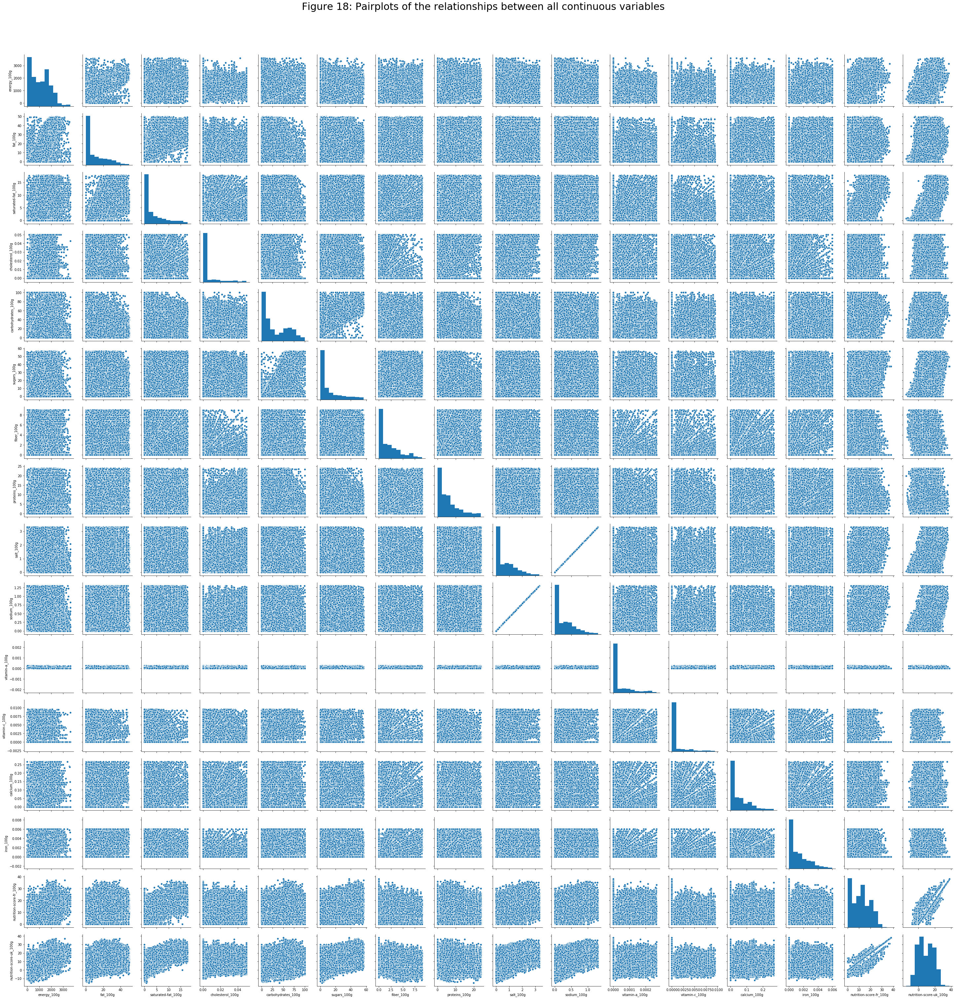

In [117]:
with np.errstate(invalid='ignore'): # suppress runtime error
    sns.pairplot(food_clean[actual_float_columns]);
    plt.suptitle('Figure 18: Pairplots of the relationships between all continuous variables', y=1.05, size=30);
 

The paired scatterplots mostly show clouds of dots whith very few where a linear relationship can clearly be identified. For example: 
* between `vitamin-a_100g`and all the others, where a null correlation can be clearly established as the dots form an hotizontal line. 
* between `sodium_100g` and `salt_100g`, where a strong positive relationship is shown
* between `nutrition-score-france_100g`and `nutrition-score-uk_100g`, where a strong positive relationship can also be seen.

None of the pairplots seem to describe a non-linear relationship, so we decide to use the pearson coefficient of correlation to measure the strength of the relationship between the variables, but we do not expect very high values. 

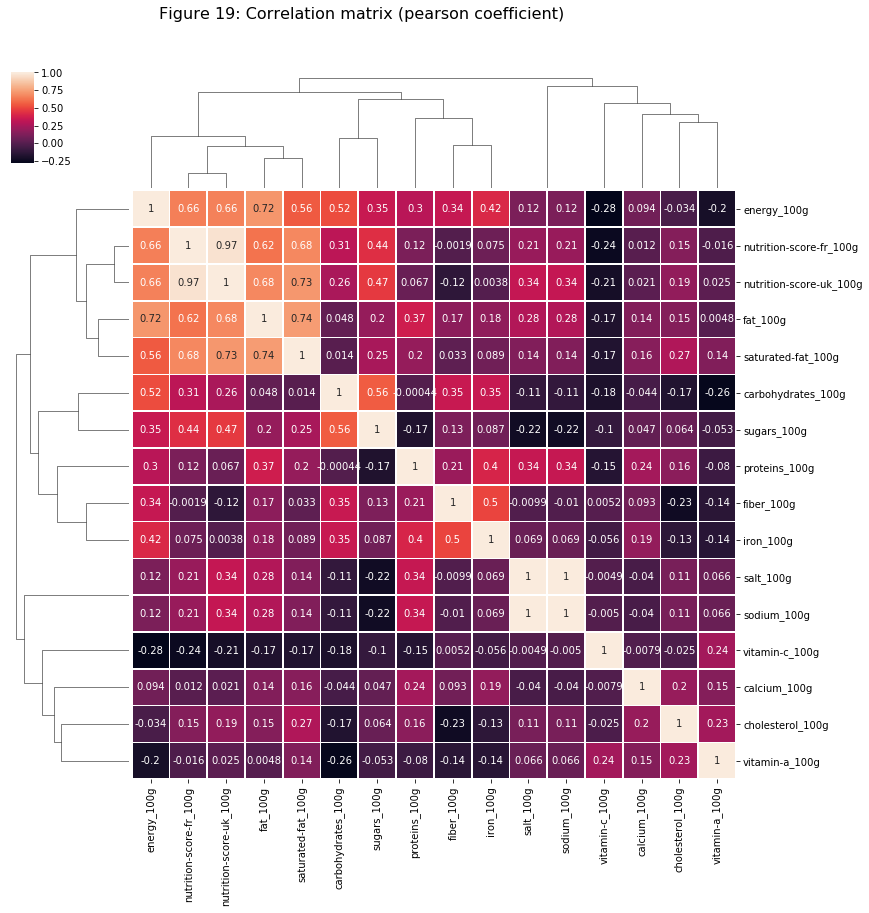

In [118]:
# Correlation: 
corr = food_clean[actual_float_columns].corr(method = "pearson")

#f, ax = plt.subplots(figsize=(15, 15))

#sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), 
#            cmap=sns.diverging_palette(220, 10, as_cmap=True), square=True, ax=ax);

sns.clustermap(corr, cmap="rocket", annot = True,
               linewidths=.75, figsize=(13, 13));

plt.suptitle('Figure 19: Correlation matrix (pearson coefficient)', y=0.95, size=16);
    

As expected, the pearson coefficients are globally very low. Except for the correlation between the french and the uk nutrition scores, the most meaningful relationships in the dataset (pearson coefficient > 0.6) are between:
* sodium and salt (1)
* fat and saturated fat (0.74)
* fat and energy (0.72)
* nutrition scores (both) and energy (0.66)
* nutrition scores and fat (0.62/0.68)
* nutrition scores and saturated fat (0.68/0.73)

We can conclude two things from this correlation matrix: 
* Fats and saturated fats might be a confounding factor in the relationship between nutrition score and energy.
* The positive correlation between both nutrition scores and energy, fat and saturated fat means that when the higher the amount of fats/energy in a product, the higher it's score and thus, the lower it's nutritional qality.